# Library & Setup

Imported Library

In [1]:
import sys
import logging
import torch
import re
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader
from torch import optim
import torch.nn as nn
import optuna
import json
import matplotlib.pyplot as plt

from   dataclasses import asdict

Own Library

In [2]:
from datasets import *
from utils import *
from config import *
from engine import *
from models import *
from entities import Portfolio

Setup & Config

In [3]:
setup_logging()

2026-03-23 22:14:21,112 - utils.setup - INFO - Logger is set up.


<Logger utils.setup (INFO)>

In [4]:
exp_name: str
device: torch.device
random_seed: int
dataset_ratios: list[float]

# Simulation
steps_sim: int
paths_sim: int

# Window
window_size: int
stride: int
normalize_window: bool
normalize_shift: int
normalize_prefix_window: bool

# Training
epochs: int
batch_size: int
skip_training: bool
max_grad_norm: float
clip_gradients: bool
save_every_epochs: int

# Optimizer
criterion: str
lr: float
weight_decay: float
betas: tuple
eps: float

# Scheduler
use_scheduler: bool
scheduler_type: str
eta_min: float

# DDPM
noise_steps: int
beta_start: float
beta_end: float

# DDPM Transformer
d_model: int
n_heads: int
n_layers: int
max_t: int
dropout: float
dim_feedforward: int

# Optuna
n_trials: int
min_resource: int
max_resource: int
reduction_factor: int
epochs_per_trial: int
skip_optuna: bool

# Features
symbols: list
interval: str
start_date: str
end_date: str
sequence_mode: str

# Conditioning
indicators: list
indicator_period: int
indicator_shift: int
sequence_depth: int
annual_risk_free_rate: float

skip_evaluation: bool
skip_setup_random_seed: bool

config = Config(
    exp_name="v1s1_baseline",
    device=torch.device("cuda:1"),
    epochs=200,
    epochs_per_trial=10,
    n_trials=100,
    steps_sim=120,
    sequence_depth=120, # equals steps_sim
    indicator_shift=120, # equals steps_sim
    window_size=160,
    normalize_shift=160, # equals window_size
    normalize_prefix_window=True,
)
globals().update(asdict(config))

print(f"Configuration:\n{config}")

Configuration:
Config(exp_name='v1s1_baseline', description='DDPM Transformer inside laten space from [B, L, A, C] when compute [B, L, A * C]', skip_training=False, skip_optuna=False, skip_evaluation=False, skip_setup_random_seed=False, device=device(type='cuda', index=1), random_seed=78, dataset_ratios=[0.8, 0.1, 0.1], steps_sim=120, paths_sim=1000, window_size=160, stride=1, normalize_window=True, normalize_shift=160, normalize_prefix_window=True, epochs=200, batch_size=64, max_grad_norm=1.0, clip_gradients=True, save_every_epochs=50, criterion='MSELoss', lr=0.0001, weight_decay=1e-06, betas=(0.9, 0.999), eps=1e-08, use_scheduler=False, scheduler_type='cosine', eta_min=1e-06, model_name='DDPM_Transformer', noise_steps=1000, beta_start=0.0001, beta_end=0.02, d_model=128, n_heads=4, n_layers=4, max_t=256, dropout=0.1, dim_feedforward=512, n_trials=100, min_resource=3, max_resource=50, reduction_factor=3, epochs_per_trial=10, symbols=['AAPL', 'TSLA', 'MSFT', 'NVDA', 'GOOGL', 'AMZN', 'GO

In [5]:
if not skip_setup_random_seed:
    setup_random_seed(random_seed)

# Preprocessing / Feature Engineering

## Dowload Data & Setup

In [6]:
# Download historical stock data for the specified symbols and date range
tickers = yf.Tickers(" ".join(symbols)).tickers
df_data = yf.download(list(tickers.keys()), start=start_date, end=end_date, interval=interval)

# Display the first few rows of the data
df_data

[*********************100%***********************]  14 of 14 completed


Price            Close                                               \
Ticker            AAPL        ADBE        AMD       AMZN       AVGO   
Date                                                                  
2010-01-04    6.412384   37.090000   9.700000   6.695000   1.328563   
2010-01-05    6.423470   37.700001   9.710000   6.734500   1.338425   
2010-01-06    6.321294   37.619999   9.570000   6.612500   1.348992   
2010-01-07    6.309609   36.889999   9.470000   6.500000   1.340539   
2010-01-08    6.351558   36.689999   9.430000   6.676000   1.350400   
...                ...         ...        ...        ...        ...   
2022-12-23  129.778839  338.450012  64.519997  85.250000  52.818520   
2022-12-27  127.977745  335.089996  63.270000  83.040001  52.924660   
2022-12-28  124.050690  328.329987  62.570000  81.820000  52.097622   
2022-12-29  127.564392  337.579987  64.820000  84.180000  53.332905   
2022-12-30  127.879311  336.529999  64.769997  84.000000  53.459126   

Price                                                                ...  \
Ticker             CRM       CSCO       GOOG      GOOGL        META  ...   
Date                                                                 ...   
2010-01-04   18.480459  15.975697  15.483124  15.555862         NaN  ...   
2010-01-05   18.401419  15.904524  15.414940  15.487361         NaN  ...   
2010-01-06   18.369308  15.800994  15.026350  15.096945         NaN  ...   
2010-01-07   18.287798  15.872165  14.676542  14.745495         NaN  ...   
2010-01-08   18.314968  15.956285  14.872199  14.942069         NaN  ...   
...                ...        ...        ...        ...         ...  ...   
2022-12-23  127.886139  43.262501  89.078674  88.498566  117.120895  ...   
2022-12-27  129.091507  43.308071  87.213982  86.673637  115.969933  ...   
2022-12-28  126.927795  42.888924  85.755936  85.314873  114.719742  ...   
2022-12-29  130.948929  43.280727  88.225677  87.724945  119.323631  ...   
2022-12-30  130.998322  43.408291  88.007469  87.506760  119.402985  ...   

Price         Volume                                                       \
Ticker          AVGO      CRM      CSCO       GOOG      GOOGL        META   
Date                                                                        
2010-01-04   5387000  7906000  59853700   78541293   78169752         NaN   
2010-01-05   3011000  7942400  45124500  120638494  120067812         NaN   
2010-01-06   5331000  5122400  35715700  159744526  158988852         NaN   
2010-01-07   2718000  4840000  31531200  257533695  256315428         NaN   
2010-01-08   2899000  5510400  39115900  189680313  188783028         NaN   
...              ...      ...       ...        ...        ...         ...   
2022-12-23  13761000  5821300   9554400   17815000   23003000  17796600.0   
2022-12-27  16677000  8300800  12066200   15470900   20097300  21392300.0   
2022-12-28  15410000  6249800   9847400   17879600   19523200  19612500.0   
2022-12-29  18176000  7628800  11396500   18280700   23333500  22366200.0   
2022-12-30  14376000  5630200  13199800   19190300   23986300  19583800.0   

Price                                                   
Ticker          MSFT       NVDA      ORCL         TSLA  
Date                                                    
2010-01-04  38409100  800204000  26795000          NaN  
2010-01-05  49749600  728648000  28669900          NaN  
2010-01-06  58182400  649168000  24560700          NaN  
2010-01-07  50559700  547792000  30469700          NaN  
2010-01-08  51197400  478168000  23542400          NaN  
...              ...        ...       ...          ...  
2022-12-23  21207000  349326000   4129100  166989700.0  
2022-12-27  16688600  464902000   4290700  208643400.0  
2022-12-28  17457100  351066000   3794000  221070500.0  
2022-12-29  19770700  354923000   3867800  221923300.0  
2022-12-30  21938500  310490000   5375700  157777300.0  

[3272 rows x 70 columns]

In [7]:
levels_col = df_data.columns.names
print(f"Column Levels: {levels_col}")

# Get unique asset names from the first level of the MultiIndex columns (Level = Price)
features_asset = list(df_data.columns.get_level_values(0).unique())
print(f"Features(Unique) each asset: {features_asset}")

Column Levels: ['Price', 'Ticker']
Features(Unique) each asset: ['Close', 'High', 'Low', 'Open', 'Volume']


Select Target Feature

In [8]:
features_target = ["Close"]
print(f"Target feature: {features_target}")

Target feature: ['Close']


## Data Preprocessing

### Data Observation

#### Data Visualization (Missing Values)

In [9]:
def plot_missing_data(data, symbols, title_suffix="Close Price"):
    """
    Plot time series data and highlight missing values.

    Args:
        data: DataFrame with time series data (index as dates, columns as symbols)
        symbols: List of symbol names to plot
        title_suffix: Suffix for the plot title
    """
    fig, axes = plt.subplots(len(symbols), 1, figsize=(14, 12))

    for idx, symbol in enumerate(symbols):
        ax = axes[idx] if len(symbols) > 1 else axes

        series = data[symbol]

        # Plot the data
        ax.plot(series.index, series.values, linewidth=1, label=symbol)

        # Highlight NaN values
        nan_mask = series.isna()
        if nan_mask.any():
            nan_indices = series.index[nan_mask]
            ax.scatter(nan_indices, [0]*len(nan_indices), color='red', marker='x', s=50, label='NaN')

        ax.set_ylabel('Value')
        ax.set_title(f'{symbol} - {title_suffix} (Red X = NaN values)')
        ax.legend(loc='upper left')
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return fig, axes


def print_nan_summary(data, symbols):
    """
    Print NaN count and percentage for each symbol.

    Args:
        data: DataFrame with time series data
        symbols: List of symbol names
    """
    print("NaN Count and Percentage for Each Symbol:")
    print("-" * 50)
    for symbol in symbols:
        series = data[symbol]
        nan_count = series.isna().sum()
        nan_pct = (nan_count / len(series)) * 100
        valid_count = len(series) - nan_count
        print(f"{symbol:8} - NaN: {nan_count:4d} ({nan_pct:5.2f}%) | Valid: {valid_count:4d}")

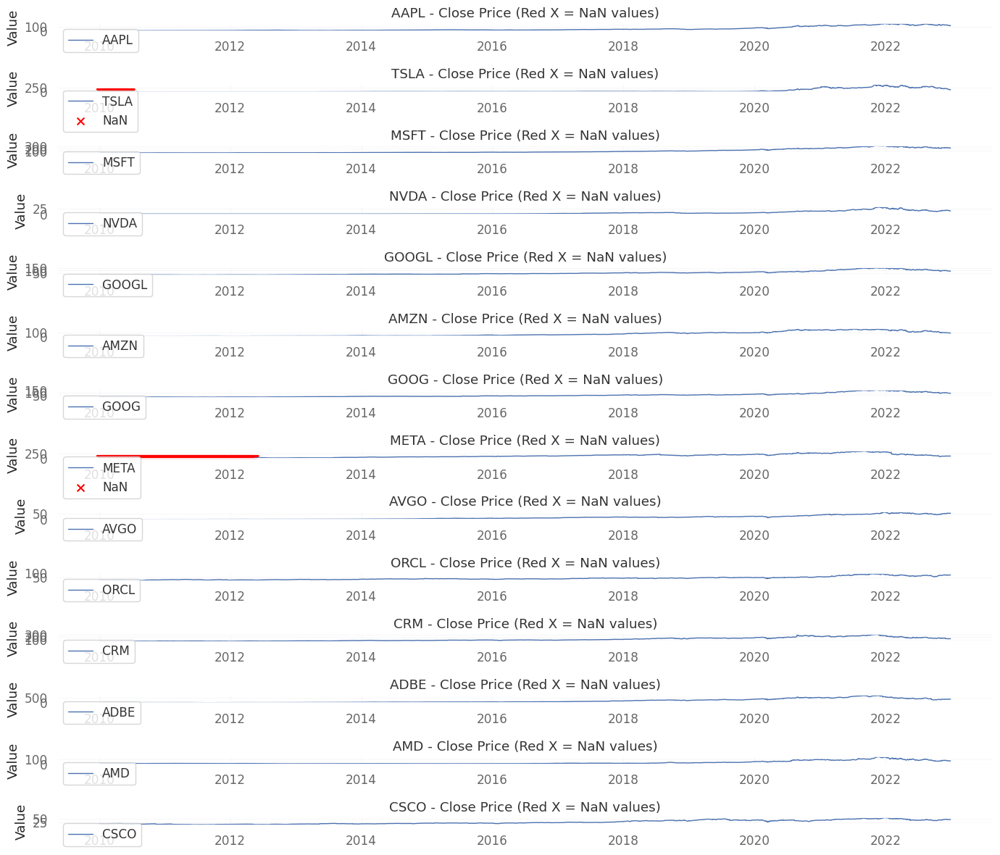

NaN Count and Percentage for Each Symbol:
--------------------------------------------------
AAPL     - NaN:    0 ( 0.00%) | Valid: 3272
TSLA     - NaN:  122 ( 3.73%) | Valid: 3150
MSFT     - NaN:    0 ( 0.00%) | Valid: 3272
NVDA     - NaN:    0 ( 0.00%) | Valid: 3272
GOOGL    - NaN:    0 ( 0.00%) | Valid: 3272
AMZN     - NaN:    0 ( 0.00%) | Valid: 3272
GOOG     - NaN:    0 ( 0.00%) | Valid: 3272
META     - NaN:  599 (18.31%) | Valid: 2673
AVGO     - NaN:    0 ( 0.00%) | Valid: 3272
ORCL     - NaN:    0 ( 0.00%) | Valid: 3272
CRM      - NaN:    0 ( 0.00%) | Valid: 3272
ADBE     - NaN:    0 ( 0.00%) | Valid: 3272
AMD      - NaN:    0 ( 0.00%) | Valid: 3272
CSCO     - NaN:    0 ( 0.00%) | Valid: 3272


In [10]:
# Extract close prices from df_data
close_data = df_data['Close']

fig, axes = plot_missing_data(close_data, symbols)
print_nan_summary(close_data, symbols)

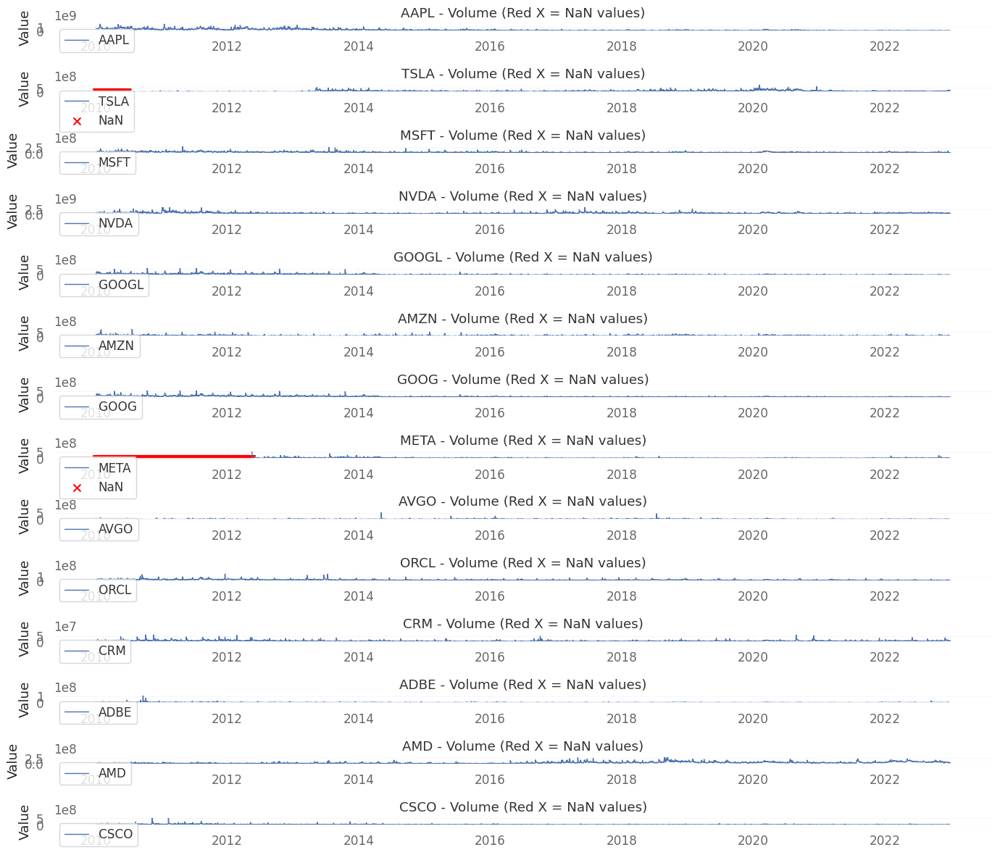

NaN Count and Percentage for Each Symbol:
--------------------------------------------------
AAPL     - NaN:    0 ( 0.00%) | Valid: 3272
TSLA     - NaN:  122 ( 3.73%) | Valid: 3150
MSFT     - NaN:    0 ( 0.00%) | Valid: 3272
NVDA     - NaN:    0 ( 0.00%) | Valid: 3272
GOOGL    - NaN:    0 ( 0.00%) | Valid: 3272
AMZN     - NaN:    0 ( 0.00%) | Valid: 3272
GOOG     - NaN:    0 ( 0.00%) | Valid: 3272
META     - NaN:  599 (18.31%) | Valid: 2673
AVGO     - NaN:    0 ( 0.00%) | Valid: 3272
ORCL     - NaN:    0 ( 0.00%) | Valid: 3272
CRM      - NaN:    0 ( 0.00%) | Valid: 3272
ADBE     - NaN:    0 ( 0.00%) | Valid: 3272
AMD      - NaN:    0 ( 0.00%) | Valid: 3272
CSCO     - NaN:    0 ( 0.00%) | Valid: 3272


In [11]:
# Extract close prices from df_data
volume_data = df_data['Volume']

fig, axes = plot_missing_data(volume_data, symbols, title_suffix="Volume")
print_nan_summary(volume_data, symbols)

In [12]:
# Find the first row where all symbols have valid (non-NaN) data
first_valid_idx = df_data.notna().all(axis=1).idxmax()

# Drop rows before the first valid index
df_data = df_data.loc[first_valid_idx:]

# Re-extract close and volume data from updated df_data
close_data = df_data['Close']
volume_data = df_data['Volume']

print(f"Data trimmed from {df_data.index[0]} to {first_valid_idx}")
print(f"Remaining rows: {len(df_data)}")

Data trimmed from 2012-05-18 00:00:00 to 2012-05-18 00:00:00
Remaining rows: 2673


In [13]:
df_data

Price            Close                                               \
Ticker            AAPL        ADBE        AMD       AMZN       AVGO   
Date                                                                  
2012-05-18   15.891775   31.309999   6.010000  10.692500   2.154365   
2012-05-21   16.817631   32.009998   6.300000  10.905500   2.218235   
2012-05-22   16.688501   32.009998   6.160000  10.766500   2.244070   
2012-05-23   17.095694   32.180000   6.080000  10.864000   2.405540   
2012-05-24   16.938684   31.540001   6.020000  10.762000   2.333058   
...                ...         ...        ...        ...        ...   
2022-12-23  129.778839  338.450012  64.519997  85.250000  52.818520   
2022-12-27  127.977745  335.089996  63.270000  83.040001  52.924660   
2022-12-28  124.050690  328.329987  62.570000  81.820000  52.097622   
2022-12-29  127.564392  337.579987  64.820000  84.180000  53.332905   
2022-12-30  127.879311  336.529999  64.769997  84.000000  53.459126   

Price                                                                ...  \
Ticker             CRM       CSCO       GOOG      GOOGL        META  ...   
Date                                                                 ...   
2012-05-18   35.958107  10.854310  14.832179  14.901862   37.932327  ...   
2012-05-21   36.815186  10.986115  15.170866  15.242142   33.765026  ...   
2012-05-22   36.913986  11.025659  14.842059  14.911790   30.758623  ...   
2012-05-23   37.200504  10.999296  15.055994  15.126730   31.750837  ...   
2012-05-24   36.113708  10.801586  14.912711  14.982775   32.772816  ...   
...                ...        ...        ...        ...         ...  ...   
2022-12-23  127.886139  43.262501  89.078674  88.498566  117.120895  ...   
2022-12-27  129.091507  43.308071  87.213982  86.673637  115.969933  ...   
2022-12-28  126.927795  42.888924  85.755936  85.314873  114.719742  ...   
2022-12-29  130.948929  43.280727  88.225677  87.724945  119.323631  ...   
2022-12-30  130.998322  43.408291  88.007469  87.506760  119.402985  ...   

Price         Volume                                                         \
Ticker          AVGO       CRM      CSCO       GOOG      GOOGL         META   
Date                                                                          
2012-05-18  22855000  36138000  57520600  239835606  238701060  573576400.0   
2012-05-21  28360000  15436400  37628500  123477094  122892984  168192700.0   
2012-05-22  28475000  12460000  42979200  122533571  121953924  101786600.0   
2012-05-23  47735000  10400000  42459500  127600492  126996876   73600000.0   
2012-05-24  27487000  10060400  52604300   75935562   75576348   50237200.0   
...              ...       ...       ...        ...        ...          ...   
2022-12-23  13761000   5821300   9554400   17815000   23003000   17796600.0   
2022-12-27  16677000   8300800  12066200   15470900   20097300   21392300.0   
2022-12-28  15410000   6249800   9847400   17879600   19523200   19612500.0   
2022-12-29  18176000   7628800  11396500   18280700   23333500   22366200.0   
2022-12-30  14376000   5630200  13199800   19190300   23986300   19583800.0   

Price                                                   
Ticker          MSFT       NVDA      ORCL         TSLA  
Date                                                    
2012-05-18  56205300  567288000  68182500   24247500.0  
2012-05-21  38787900  416260000  30712700   22128000.0  
2012-05-22  39504900  410140000  22122800   35493000.0  
2012-05-23  65171000  496000000  33179600   18306000.0  
2012-05-24  52575000  520420000  34232000   16134000.0  
...              ...        ...       ...          ...  
2022-12-23  21207000  349326000   4129100  166989700.0  
2022-12-27  16688600  464902000   4290700  208643400.0  
2022-12-28  17457100  351066000   3794000  221070500.0  
2022-12-29  19770700  354923000   3867800  221923300.0  
2022-12-30  21938500  310490000   5375700  157777300.0  

[2673 rows x 70 columns]

[                       0%                       ]

[*********************100%***********************]  14 of 14 completed


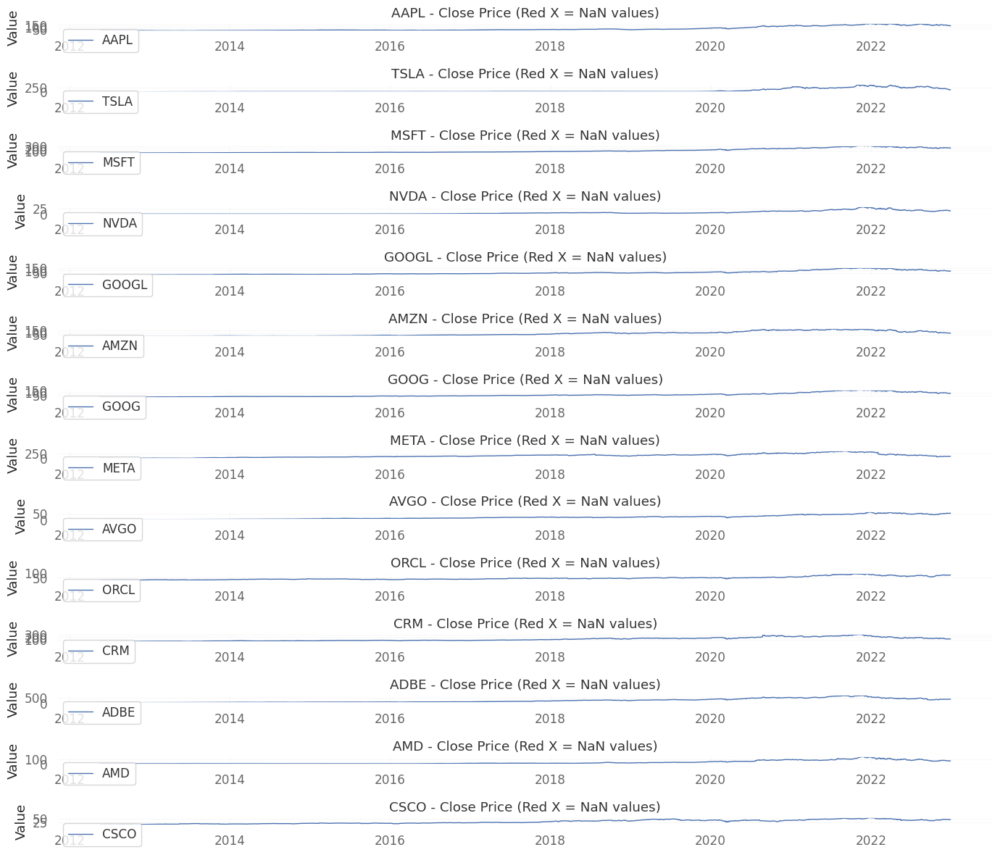

NaN Count and Percentage for Each Symbol:
--------------------------------------------------
AAPL     - NaN:    0 ( 0.00%) | Valid: 2673
TSLA     - NaN:    0 ( 0.00%) | Valid: 2673
MSFT     - NaN:    0 ( 0.00%) | Valid: 2673
NVDA     - NaN:    0 ( 0.00%) | Valid: 2673
GOOGL    - NaN:    0 ( 0.00%) | Valid: 2673
AMZN     - NaN:    0 ( 0.00%) | Valid: 2673
GOOG     - NaN:    0 ( 0.00%) | Valid: 2673
META     - NaN:    0 ( 0.00%) | Valid: 2673
AVGO     - NaN:    0 ( 0.00%) | Valid: 2673
ORCL     - NaN:    0 ( 0.00%) | Valid: 2673
CRM      - NaN:    0 ( 0.00%) | Valid: 2673
ADBE     - NaN:    0 ( 0.00%) | Valid: 2673
AMD      - NaN:    0 ( 0.00%) | Valid: 2673
CSCO     - NaN:    0 ( 0.00%) | Valid: 2673


In [14]:
start_date = "2012-05-18"

# Download historical stock data for the specified symbols and date range
tickers = yf.Tickers(" ".join(symbols)).tickers
df_data = yf.download(list(tickers.keys()), start=start_date, end=end_date, interval=interval)

# Extract close prices from df_data
close_data = df_data['Close']

fig, axes = plot_missing_data(close_data, symbols)
print_nan_summary(close_data, symbols)

### Feature Engineering

In [15]:
df_data.ffill(inplace=True)

print(f"Data shape after trimming: {df_data.shape}")

Data shape after trimming: (2673, 70)


In [16]:
levels_col: list = df_data.columns.names
print(f"Column Levels: {levels_col}")

# Get unique asset names from the first level of the MultiIndex columns (Level = Price)
features_asset: list = list(df_data.columns.get_level_values(0).unique())
print(f"Features(Unique) each asset: {features_asset}")

assets: list = df_data.columns.get_level_values(1).unique().tolist()
print(f"Assets: {assets}")

Column Levels: ['Price', 'Ticker']
Features(Unique) each asset: ['Close', 'High', 'Low', 'Open', 'Volume']
Assets: ['AAPL', 'ADBE', 'AMD', 'AMZN', 'AVGO', 'CRM', 'CSCO', 'GOOG', 'GOOGL', 'META', 'MSFT', 'NVDA', 'ORCL', 'TSLA']


In [17]:
import talib as ta

def create_features(data, symbol, time_prd=indicator_period, day_shift=indicator_shift, features_config=None):
    """
    Create technical features for a single asset.

    Args:
        data: DataFrame with OHLCV data for one symbol
        symbol: Symbol name
        time_prd: Period for rolling calculations
        day_shift: Shift amount for lagging features
        features_config: Dict of feature names to enable/disable
                        If None, creates all features by default

    Returns:
        DataFrame with original + engineered features (MultiIndex format)
    """

    # Default: enable all features
    if features_config is None:
        features_config = {
            'log_returns': True, 'norm_volume': True, 'vol_shock': True,
            'distance_sma': True, 'realized_vol': True, 'cumret': True,
            'hl_range': True, 'atr': True, 'bb_position': True,
            'semi_variance': True, 'vol_regime': True, 'vwap': True
        }

    df = data.copy()
    close_price = df['Close']
    volume = df['Volume']
    high = df['High']
    low = df['Low']

    if features_config['log_returns']:
        log_ret = np.log(close_price).diff()
        df["Log_Returns"] = log_ret

    if features_config['norm_volume']:
        sma_vol = ta.SMA(volume, timeperiod=time_prd)
        df["Norm_Volume"] = ((volume - sma_vol) / sma_vol).shift(day_shift)

    if features_config['vol_shock']:
        df["Vol_Shock"] = (volume / volume.rolling(time_prd).mean()).shift(day_shift)

    if features_config['distance_sma']:
        sma_price = ta.SMA(close_price, timeperiod=time_prd)
        df[f"Distance_SMA"] = ((close_price - sma_price) / close_price).shift(day_shift)

    if features_config['realized_vol']:
        log_ret = np.log(close_price).diff()
        df[f"RealizedVol"] = (np.sqrt((log_ret**2).rolling(time_prd).sum())).shift(day_shift)

    if features_config['cumret']:
        df["CumRet_5"] = np.log(close_price).diff(5).shift(day_shift)
        df["CumRet_20"] = np.log(close_price).diff(20).shift(day_shift)

    if features_config['hl_range']:
        df["HL_Range"] = ((high - low) / close_price).shift(day_shift)

    if features_config['atr']:
        df[f"ATR"] = ta.ATR(high, low, close_price, timeperiod=time_prd).shift(day_shift)

    if features_config['bb_position']:
        sma_price = ta.SMA(close_price, timeperiod=time_prd)
        std = close_price.rolling(time_prd).std()
        df["BB_Position"] = ((close_price - sma_price) / (2 * std)).shift(day_shift)

    if features_config['semi_variance']:
        log_ret = np.log(close_price).diff()
        downside = log_ret.copy()
        downside[downside > 0] = 0
        df[f"SemiVar"] = (np.sqrt((downside**2).rolling(time_prd).mean())).shift(day_shift)

    if features_config['vol_regime']:
        rv = df.get("RealizedVol", np.sqrt((np.log(close_price).diff()**2).rolling(time_prd).sum()))
        df["Vol_Regime"] = (rv > rv.rolling(60).mean()).astype(int).shift(day_shift)

    if features_config['vwap']:
        typical_price = (high + low + close_price) / 3
        rolling_vwap = (typical_price * volume).rolling(time_prd).sum() / volume.rolling(time_prd).sum()
        df["Distance_VWAP"] = ((close_price - rolling_vwap) / close_price).shift(day_shift)

    # Restore MultiIndex
    df.columns = pd.MultiIndex.from_product([[symbol], df.columns])
    return df

In [18]:
# Usage - create all features
processed_dfs = [create_features(df_data.xs(sym, level=1, axis=1), sym) for sym in assets]
df_updated = pd.concat(processed_dfs, axis=1).dropna()


features_config = {
    'log_returns': True,
    'norm_volume': True,
    'vol_shock': True,
    'distance_sma': True,
    'realized_vol': True,
    'cumret': True,
    'hl_range': True,
    'atr': True,
    'bb_position': True,
    'semi_variance': True,
    'vol_regime': True,
    'vwap': True
}

# Usage - custom features (only log_returns, volume, ATR)
custom_config = {k: False for k in features_config.keys()}
custom_config.update({'log_returns': True, 'norm_volume': True, 'atr': True})
processed_dfs = [create_features(df_data.xs(sym, level=1, axis=1), sym, features_config=custom_config) for sym in assets]

df_updated = pd.concat(processed_dfs, axis=1)
df_updated

AAPL                                                 \
Price            Close        High         Low        Open     Volume   
Date                                                                    
2012-05-18   15.891788   16.282205   15.646092   15.999055  732292400   
2012-05-21   16.817640   16.825432   16.001748   16.015232  631106000   
2012-05-22   16.688496   17.195169   16.556958   17.065428  694870400   
2012-05-23   17.095690   17.162807   16.576431   16.704371  584897600   
2012-05-24   16.938683   17.273669   16.816133   17.254792  496230000   
...                ...         ...         ...         ...        ...   
2022-12-23  129.778854  130.330013  127.593891  128.853688   63814900   
2022-12-27  127.977715  129.335939  126.688393  129.306413   69007800   
2022-12-28  124.050713  128.961953  123.883397  127.623418   85438400   
2022-12-29  127.564362  128.420626  125.714036  125.969927   75703700   
2022-12-30  127.879311  127.898999  125.418776  126.383312   77034200   

                                                    ADBE              ...  \
Price      Log_Returns Norm_Volume       ATR       Close        High  ...   
Date                                                                  ...   
2012-05-18         NaN         NaN       NaN   31.309999   32.099998  ...   
2012-05-21    0.056626         NaN       NaN   32.009998   32.070000  ...   
2012-05-22   -0.007709         NaN       NaN   32.009998   32.250000  ...   
2012-05-23    0.024107         NaN       NaN   32.180000   32.209999  ...   
2012-05-24   -0.009226         NaN       NaN   31.540001   32.169998  ...   
...                ...         ...       ...         ...         ...  ...   
2022-12-23   -0.002802   -0.114597  4.434961  338.450012  338.920013  ...   
2022-12-27   -0.013976   -0.190495  4.372594  335.089996  338.160004  ...   
2022-12-28   -0.031166   -0.180159  4.238989  328.329987  338.500000  ...   
2022-12-29    0.027931   -0.142490  4.164688  337.579987  339.500000  ...   
2022-12-30    0.002466    0.057213  4.118125  336.529999  336.640015  ...   

                  ORCL                  TSLA                          \
Price      Norm_Volume       ATR       Close        High         Low   
Date                                                                   
2012-05-18         NaN       NaN    1.837333    1.897333    1.788667   
2012-05-21         NaN       NaN    1.918000    1.950667    1.808000   
2012-05-22         NaN       NaN    2.053333    2.089333    2.000000   
2012-05-23         NaN       NaN    2.068000    2.070000    1.966667   
2012-05-24         NaN       NaN    2.018667    2.083333    1.979333   
...                ...       ...         ...         ...         ...   
2022-12-23   -0.408400  2.034816  123.150002  128.619995  121.019997   
2022-12-27   -0.213330  1.943863  109.099998  119.669998  108.760002   
2022-12-28   -0.482552  1.866885  112.709999  116.269997  108.239998   
2022-12-29   -0.476104  1.806609  121.820000  123.570000  117.500000   
2022-12-30   -0.156383  1.805273  123.180000  124.480003  119.750000   

                                                                      
Price             Open     Volume Log_Returns Norm_Volume        ATR  
Date                                                                  
2012-05-18    1.891333   24247500         NaN         NaN        NaN  
2012-05-21    1.838667   22128000    0.042968         NaN        NaN  
2012-05-22    2.006667   35493000    0.068181         NaN        NaN  
2012-05-23    2.037333   18306000    0.007118         NaN        NaN  
2012-05-24    2.083333   16134000   -0.024145         NaN        NaN  
...                ...        ...         ...         ...        ...  
2022-12-23  126.370003  166989700   -0.017707   -0.244215  14.340466  
2022-12-27  117.500000  208643400   -0.121138   -0.113442  14.289718  
2022-12-28  110.349998  221070500    0.032553    0.106885  14.256166  
2022-12-29  120.389999  221923300    0.077726    0.0729

### New function about scaling

In [19]:
df_updated

AAPL                                                 \
Price            Close        High         Low        Open     Volume   
Date                                                                    
2012-05-18   15.891788   16.282205   15.646092   15.999055  732292400   
2012-05-21   16.817640   16.825432   16.001748   16.015232  631106000   
2012-05-22   16.688496   17.195169   16.556958   17.065428  694870400   
2012-05-23   17.095690   17.162807   16.576431   16.704371  584897600   
2012-05-24   16.938683   17.273669   16.816133   17.254792  496230000   
...                ...         ...         ...         ...        ...   
2022-12-23  129.778854  130.330013  127.593891  128.853688   63814900   
2022-12-27  127.977715  129.335939  126.688393  129.306413   69007800   
2022-12-28  124.050713  128.961953  123.883397  127.623418   85438400   
2022-12-29  127.564362  128.420626  125.714036  125.969927   75703700   
2022-12-30  127.879311  127.898999  125.418776  126.383312   77034200   

                                                    ADBE              ...  \
Price      Log_Returns Norm_Volume       ATR       Close        High  ...   
Date                                                                  ...   
2012-05-18         NaN         NaN       NaN   31.309999   32.099998  ...   
2012-05-21    0.056626         NaN       NaN   32.009998   32.070000  ...   
2012-05-22   -0.007709         NaN       NaN   32.009998   32.250000  ...   
2012-05-23    0.024107         NaN       NaN   32.180000   32.209999  ...   
2012-05-24   -0.009226         NaN       NaN   31.540001   32.169998  ...   
...                ...         ...       ...         ...         ...  ...   
2022-12-23   -0.002802   -0.114597  4.434961  338.450012  338.920013  ...   
2022-12-27   -0.013976   -0.190495  4.372594  335.089996  338.160004  ...   
2022-12-28   -0.031166   -0.180159  4.238989  328.329987  338.500000  ...   
2022-12-29    0.027931   -0.142490  4.164688  337.579987  339.500000  ...   
2022-12-30    0.002466    0.057213  4.118125  336.529999  336.640015  ...   

                  ORCL                  TSLA                          \
Price      Norm_Volume       ATR       Close        High         Low   
Date                                                                   
2012-05-18         NaN       NaN    1.837333    1.897333    1.788667   
2012-05-21         NaN       NaN    1.918000    1.950667    1.808000   
2012-05-22         NaN       NaN    2.053333    2.089333    2.000000   
2012-05-23         NaN       NaN    2.068000    2.070000    1.966667   
2012-05-24         NaN       NaN    2.018667    2.083333    1.979333   
...                ...       ...         ...         ...         ...   
2022-12-23   -0.408400  2.034816  123.150002  128.619995  121.019997   
2022-12-27   -0.213330  1.943863  109.099998  119.669998  108.760002   
2022-12-28   -0.482552  1.866885  112.709999  116.269997  108.239998   
2022-12-29   -0.476104  1.806609  121.820000  123.570000  117.500000   
2022-12-30   -0.156383  1.805273  123.180000  124.480003  119.750000   

                                                                      
Price             Open     Volume Log_Returns Norm_Volume        ATR  
Date                                                                  
2012-05-18    1.891333   24247500         NaN         NaN        NaN  
2012-05-21    1.838667   22128000    0.042968         NaN        NaN  
2012-05-22    2.006667   35493000    0.068181         NaN        NaN  
2012-05-23    2.037333   18306000    0.007118         NaN        NaN  
2012-05-24    2.083333   16134000   -0.024145         NaN        NaN  
...                ...        ...         ...         ...        ...  
2022-12-23  126.370003  166989700   -0.017707   -0.244215  14.340466  
2022-12-27  117.500000  208643400   -0.121138   -0.113442  14.289718  
2022-12-28  110.349998  221070500    0.032553    0.106885  14.256166  
2022-12-29  120.389999  221923300    0.077726    0.0729

In [20]:
df_prefix = df_updated.iloc[:(normalize_shift + 1)] # Include 1 because use log return to calculate
df_prefix

AAPL                                                          \
Price           Close       High        Low       Open     Volume Log_Returns   
Date                                                                            
2012-05-18  15.891788  16.282205  15.646092  15.999055  732292400         NaN   
2012-05-21  16.817640  16.825432  16.001748  16.015232  631106000    0.056626   
2012-05-22  16.688496  17.195169  16.556958  17.065428  694870400   -0.007709   
2012-05-23  17.095690  17.162807  16.576431  16.704371  584897600    0.024107   
2012-05-24  16.938683  17.273669  16.816133  17.254792  496230000   -0.009226   
...               ...        ...        ...        ...        ...         ...   
2013-01-03  16.387186  16.616020  16.353934  16.561910  352965200   -0.012703   
2013-01-04  15.930735  16.282299  15.895366  16.232119  594333600   -0.028249   
2013-01-07  15.837019  16.000255  15.574026  15.779583  484156400   -0.005900   
2013-01-08  15.879642  16.078549  15.756913  15.997535  458707200    0.002688   
2013-01-09  15.631463  15.870575  15.597908  15.794699  407604400   -0.015752   

                                       ADBE             ...        ORCL  \
Price      Norm_Volume       ATR      Close       High  ... Norm_Volume   
Date                                                    ...               
2012-05-18         NaN       NaN  31.309999  32.099998  ...         NaN   
2012-05-21         NaN       NaN  32.009998  32.070000  ...         NaN   
2012-05-22         NaN       NaN  32.009998  32.250000  ...         NaN   
2012-05-23         NaN       NaN  32.180000  32.209999  ...         NaN   
2012-05-24         NaN       NaN  31.540001  32.169998  ...         NaN   
...                ...       ...        ...        ...  ...         ...   
2013-01-03    0.312820  0.333033  37.750000  38.299999  ...    0.126956   
2013-01-04    0.173504  0.334393  38.130001  38.189999  ...    0.001636   
2013-01-07   -0.150685  0.328250  37.939999  38.209999  ...   -0.063239   
2013-01-08   -0.177912  0.319036  38.139999  38.200001  ...   -0.266649   
2013-01-09   -0.201408  0.314119  38.660000  38.709999  ...    0.031392   

                          TSLA                                          \
Price            ATR     Close      High       Low      Open    Volume   
Date                                                                     
2012-05-18       NaN  1.837333  1.897333  1.788667  1.891333  24247500   
2012-05-21       NaN  1.918000  1.950667  1.808000  1.838667  22128000   
2012-05-22       NaN  2.053333  2.089333  2.000000  2.006667  35493000   
2012-05-23       NaN  2.068000  2.070000  1.966667  2.037333  18306000   
2012-05-24       NaN  2.018667  2.083333  1.979333  2.083333  16134000   
...              ...       ...       ...       ...       ...       ...   
2013-01-03  0.534317  2.318000  2.363333  2.316667  2.345333  11130000   
2013-01-04  0.546704  2.293333  2.320000  2.261333  2.320000  10110000   
2013-01-07  0.561145  2.289333  2.320000  2.260000  2.320000   6630000   
2013-01-08  0.548690  2.245333  2.300000  2.207333  2.300000  19260000   
2013-01-09  0.549469  2.242667  2.279333  2.226667  2.267333  10470000   

                                              
Price      Log_Returns Norm_Volume       ATR  
Date                                          
2012-05-18         NaN         NaN       NaN  
2012-05-21    0.042968         NaN       NaN  
2012-05-22    0.068181         NaN       NaN  
2012-05-23    0.007118         NaN       NaN  
2012-05-24   -0.024145         NaN       NaN  
...                ...         ...       ...  
2013-01-03   -0.016826   -0.523087  0.094708  
2013-01-04   -0.010699   -0.123491  0.098467  
2013-01-07   -0.001746    0.124938  0.099528  
2013-01-08   -0.019407    0.481203  0.102419  
2013-01-09   -0.001188    1.188062  0.112151  

[161 rows x 112 columns]

In [21]:
def create_sequences(df, feature_name, steps: int, mode: str = "backward"):
    """
    Build a sequence dataframe for `feature_name`.

    Parameters
    ----------
    df : DataFrame
        Multi‑index (asset,price) dataframe.
    feature_name : str
        Level‑1 column to sequence (e.g. "Log_Returns").
    steps : int
        Number of days to include before/after the current row.
    mode : {'past','future'}
        'backward'  – shift forwards (0 .. steps) to get current + previous values.
        'forward' – shift backwards (0 .. steps) to get current + subsequent values.

    Returns
    -------
    DataFrame
        Columns named `<asset>_D<n>` for n=0..steps.
    """
    tgt = df.xs(feature_name, level=1, axis=1)

    seqs = []
    for step in range(steps + 1):
        if mode == "forward":
            shifted = tgt.shift(-step)
        else:
            shifted = tgt.shift(step)          # default to past
        shifted.columns = [f"{col}_D{step}" for col in shifted.columns]
        seqs.append(shifted)

    result = pd.concat(seqs, axis=1)
    result = result.sort_index(axis=1)
    return result


In [22]:
# ต้องการ rows = steps_sim (NaN จาก log return) + sequence_depth + window_size + 1
n_prefix_needed = steps_sim + sequence_depth + window_size + 1

# เก็บ prefix raw ก่อน dropna
df_prefix_raw = df_updated.iloc[:n_prefix_needed].copy()

In [23]:
feature_target = "Log_Returns"
x_prefix = df_prefix.xs(feature_target, level=1, axis=1)

print(f"before drop NaN values x_prefix shape: {x_prefix.shape}")
x_prefix = x_prefix.dropna().values
print(f"after drop NaN values x_prefix shape: {x_prefix.shape}")

before drop NaN values x_prefix shape: (161, 14)
after drop NaN values x_prefix shape: (160, 14)


In [24]:
print(f"before drop NaN values df_updated shape: {df_updated.shape}")
df_updated = df_updated.dropna()
print(f"after drop NaN values df_updated shape: {df_updated.shape}")

before drop NaN values df_updated shape: (2673, 112)
after drop NaN values df_updated shape: (2539, 112)


In [25]:
features = list(df_updated.columns.get_level_values(1).unique())
print(f"Features {features}")

Features ['Close', 'High', 'Low', 'Open', 'Volume', 'Log_Returns', 'Norm_Volume', 'ATR']


In [26]:
drop_features = ["Open", "Low", "High", "Volume"]
df_updated = df_updated.drop(columns=drop_features, level="Price").copy()
df_updated

AAPL                                          ADBE  \
Price            Close Log_Returns Norm_Volume       ATR       Close   
Date                                                                   
2012-11-30   17.692484   -0.006947   -0.277315  0.435812   34.610001   
2012-12-03   17.719994    0.001554    0.236897  0.442928   34.700001   
2012-12-04   17.407429   -0.017797   -0.052466  0.432521   35.299999   
2012-12-05   16.287132   -0.066522   -0.330764  0.418962   35.400002   
2012-12-06   16.542570    0.015562   -0.192432  0.402391   35.139999   
...                ...         ...         ...       ...         ...   
2022-12-23  129.778854   -0.002802   -0.114597  4.434961  338.450012   
2022-12-27  127.977715   -0.013976   -0.190495  4.372594  335.089996   
2022-12-28  124.050713   -0.031166   -0.180159  4.238989  328.329987   
2022-12-29  127.564362    0.027931   -0.142490  4.164688  337.579987   
2022-12-30  127.879311    0.002466    0.057213  4.118125  336.529999   

                                                     AMD              ...  \
Price      Log_Returns Norm_Volume        ATR      Close Log_Returns  ...   
Date                                                                  ...   
2012-11-30    0.015139   -0.123024   0.780714   2.200000    0.075508  ...   
2012-12-03    0.002597    0.071172   0.786377   2.360000    0.070204  ...   
2012-12-04    0.017143   -0.067751   0.776636   2.260000   -0.043297  ...   
2012-12-05    0.002829    0.171566   0.760448   2.290000    0.013187  ...   
2012-12-06   -0.007372    0.809157   0.757559   2.340000    0.021599  ...   
...                ...         ...        ...        ...         ...  ...   
2022-12-23    0.005719   -0.368713  15.190966  64.519997    0.010282  ...   
2022-12-27   -0.009977   -0.328349  14.798040  63.270000   -0.019564  ...   
2022-12-28   -0.020380   -0.501014  14.313894  62.570000   -0.011125  ...   
2022-12-29    0.027783   -0.317115  13.932902  64.820000    0.035328  ...   
2022-12-30   -0.003115    0.060126  14.266979  64.769997   -0.000772  ...   

                  NVDA                 ORCL                                    \
Price      Norm_Volume       ATR      Close Log_Returns Norm_Volume       ATR   
Date                                                                            
2012-11-30   -0.104250  0.009970  26.534222    0.010622   -0.193253  0.513276   
2012-12-03    0.891495  0.010257  26.641409    0.004031   -0.240806  0.514742   
2012-12-04    0.103122  0.010130  26.699125    0.002164   -0.039159  0.502612   
2012-12-05    0.099305  0.010077  26.385790   -0.011805   -0.252906  0.501321   
2012-12-06    0.297625  0.009931  26.410528    0.000937    0.304993  0.514787   
...                ...       ...        ...         ...         ...       ...   
2022-12-23   -0.000643  0.920563  77.697746    0.004463   -0.408400  2.034816   
2022-12-27   -0.059942  0.912929  77.822678    0.001607   -0.213330  1.943863   
2022-12-28   -0.097932  0.893931  77.198029   -0.008059   -0.482552  1.866885   
2022-12-29   -0.134001  0.887130  78.226311    0.013232   -0.476104  1.806609   
2022-12-30   -0.088925  0.863272  78.553047    0.004168   -0.156383  1.805273   

                  TSLA                                     
Price            Close Log_Returns Norm_Volume        ATR  
Date                                                       
2012-11-30    2.254667    0.003851   -0.219328   0.108238  
2012-12-03    2.308000    0.023379   -0.404884   0.110221  
2012-12-04    2.260000   -0.021017   -0.394892   0.107253  
2012-12-05    2.247333   -0.005621   -0.075921   0.105163  
2012-12-06    2.260000    0.005621   -0.029726   0.107318  
...                ...         ...         ...        ...  
2022-12-23  123.150002   -0.017707   -0.244215  14.340466  
2022-12-27  109.099998   -0.121138   -0.113442  14.289718  
2022-12-28  112.709999    0.032553    0.106885  14.256166  
2022-12-29  121.820000    0.077726    0.072992  14.626202  
2022-12-30  123

In [27]:
df_updated.xs("AAPL", axis=1, level=0)

Price,Close,Log_Returns,Norm_Volume,ATR
Date,,,,
2012-11-30,17.692484,-0.006947,-0.277315,0.435812
2012-12-03,17.719994,0.001554,0.236897,0.442928
2012-12-04,17.407429,-0.017797,-0.052466,0.432521
2012-12-05,16.287132,-0.066522,-0.330764,0.418962
2012-12-06,16.542570,0.015562,-0.192432,0.402391
...,...,...,...,...
2022-12-23,129.778854,-0.002802,-0.114597,4.434961
2022-12-27,127.977715,-0.013976,-0.190495,4.372594
2022-12-28,124.050713,-0.031166,-0.180159,4.238989


#### Data Sequences

In [28]:
def create_sequences(df, feature_name, steps: int, mode: str = "backward"):
    """
    Build a sequence dataframe for `feature_name`.

    Parameters
    ----------
    df : DataFrame
        Multi‑index (asset,price) dataframe.
    feature_name : str
        Level‑1 column to sequence (e.g. "Log_Returns").
    steps : int
        Number of days to include before/after the current row.
    mode : {'past','future'}
        'backward'  – shift forwards (0 .. steps) to get current + previous values.
        'forward' – shift backwards (0 .. steps) to get current + subsequent values.

    Returns
    -------
    DataFrame
        Columns named `<asset>_D<n>` for n=0..steps.
    """
    tgt = df.xs(feature_name, level=1, axis=1)

    seqs = []
    for step in range(steps + 1):
        if mode == "forward":
            shifted = tgt.shift(-step)
        else:
            shifted = tgt.shift(step)          # default to past
        shifted.columns = [f"{col}_D{step}" for col in shifted.columns]
        seqs.append(shifted)

    result = pd.concat(seqs, axis=1)
    result = result.sort_index(axis=1)
    return result

In [29]:
def build_prefix_x(df_raw, feature_name, steps, mode, window_size, sort_key_fn):
    """
    สร้าง x_prefix shape [window_size, Assets, Features]
    จากข้อมูลก่อน main split โดยผ่าน create_sequences เหมือนกัน

    ต้องการ rows อย่างน้อย (steps + window_size + 1) แถว
    """
    df_seq = create_sequences(df_raw, feature_name, steps, mode=mode)
    df_seq = df_seq.dropna()

    if len(df_seq) < window_size:
        raise ValueError(
            f"Prefix ไม่พอ: มี {len(df_seq)} rows แต่ต้องการ {window_size}. "
            f"เพิ่ม n_prefix_needed ให้ใหญ่ขึ้น"
        )

    # เอาแค่ window_size แถวสุดท้าย (ติดกับ t_s=0)
    df_prefix_seq = df_seq.iloc[-window_size:].copy()

    # Sort columns (เหมือน Cell 42)
    sorted_cols = sorted(df_prefix_seq.columns, key=sort_key_fn)
    df_prefix_seq = df_prefix_seq[sorted_cols]

    # MultiIndex (เหมือน Cell 53)
    tuples = [col.rsplit("_", 1) for col in df_prefix_seq.columns]
    df_prefix_seq.columns = pd.MultiIndex.from_tuples(tuples, names=["Asset", "Feature"])
    df_prefix_seq.columns = df_prefix_seq.columns.remove_unused_levels()

    n_assets   = df_prefix_seq.columns.levels[0].size
    n_features = df_prefix_seq.columns.levels[1].size  # = steps + 1 = 121

    prefix_x = df_prefix_seq.values.reshape(window_size, n_assets, n_features)
    # shape: [window_size, 14, 121] ✅
    return prefix_x

##### Past & Future Sequence

In [30]:
# simple sanity check / usage examples
feature_target = "Log_Returns"

df_seq_past   = create_sequences(df_updated, feature_target, sequence_depth, mode="backward").dropna()
df_seq_future = create_sequences(df_updated, feature_target, sequence_depth, mode="forward").dropna()

print("Backward shape:", df_seq_past.shape)
print("Forward shape:", df_seq_future.shape)

Backward shape: (2419, 1694)
Forward shape: (2419, 1694)


In [31]:
df_seq_past.head(5)

,AAPL_D0,AAPL_D1,AAPL_D10,AAPL_D100,AAPL_D101,AAPL_D102,AAPL_D103,AAPL_D104,AAPL_D105,AAPL_D106,...,TSLA_D90,TSLA_D91,TSLA_D92,TSLA_D93,TSLA_D94,TSLA_D95,TSLA_D96,TSLA_D97,TSLA_D98,TSLA_D99
Date,,,,,,,,,,,,,,,,,,,,,
2013-05-24,0.006785,0.001788,-0.008354,0.043357,-0.010677,0.004008,-0.013880,0.001616,-0.004611,-0.008740,...,0.019060,0.010579,-0.018664,-0.003276,-0.001188,-0.019407,-0.001746,-0.010699,-0.016826,0.043051
2013-05-28,-0.008369,0.006785,0.003900,0.031190,0.043357,-0.010677,0.004008,-0.013880,0.001616,-0.004611,...,0.005882,0.019060,0.010579,-0.018664,-0.003276,-0.001188,-0.019407,-0.001746,-0.010699,-0.016826
2013-05-29,0.007920,-0.008369,-0.024216,-0.012703,0.031190,0.043357,-0.010677,0.004008,-0.013880,0.001616,...,0.008178,0.005882,0.019060,0.010579,-0.018664,-0.003276,-0.001188,-0.019407,-0.001746,-0.010699
2013-05-30,0.014790,0.007920,-0.034402,-0.028249,-0.012703,0.031190,0.043357,-0.010677,0.004008,-0.013880,...,0.004064,0.008178,0.005882,0.019060,0.010579,-0.018664,-0.003276,-0.001188,-0.019407,-0.001746
2013-05-31,-0.004105,0.014790,0.013273,-0.005900,-0.028249,-0.012703,0.031190,0.043357,-0.010677,0.004008,...,0.019223,0.004064,0.008178,0.005882,0.019060,0.010579,-0.018664,-0.003276,-0.001188,-0.019407


In [32]:
df_seq_future.head(5)

,AAPL_D0,AAPL_D1,AAPL_D10,AAPL_D100,AAPL_D101,AAPL_D102,AAPL_D103,AAPL_D104,AAPL_D105,AAPL_D106,...,TSLA_D90,TSLA_D91,TSLA_D92,TSLA_D93,TSLA_D94,TSLA_D95,TSLA_D96,TSLA_D97,TSLA_D98,TSLA_D99
Date,,,,,,,,,,,,,,,,,,,,,
2012-11-30,-0.006947,0.001554,-0.038293,0.021368,0.030499,0.029009,-0.007913,0.014082,0.009961,0.023566,...,0.003664,-0.010339,0.051536,-0.003076,0.032896,0.018144,0.048163,0.016206,-0.011436,0.030658
2012-12-03,0.001554,-0.017797,0.017577,0.030499,0.029009,-0.007913,0.014082,0.009961,0.023566,-0.004460,...,-0.010339,0.051536,-0.003076,0.032896,0.018144,0.048163,0.016206,-0.011436,0.030658,-0.015504
2012-12-04,-0.017797,-0.066522,0.028632,0.029009,-0.007913,0.014082,0.009961,0.023566,-0.004460,0.011231,...,0.051536,-0.003076,0.032896,0.018144,0.048163,0.016206,-0.011436,0.030658,-0.015504,0.070502
2012-12-05,-0.066522,0.015562,-0.014318,-0.007913,0.014082,0.009961,0.023566,-0.004460,0.011231,-0.008763,...,-0.003076,0.032896,0.018144,0.048163,0.016206,-0.011436,0.030658,-0.015504,0.070502,-0.017443
2012-12-06,0.015562,-0.025897,-0.008740,0.014082,0.009961,0.023566,-0.004460,0.011231,-0.008763,-0.008354,...,0.032896,0.018144,0.048163,0.016206,-0.011436,0.030658,-0.015504,0.070502,-0.017443,-0.013238


##### Select Type of Sequence

In [33]:
if sequence_mode == "Forward":
    df_sequences = df_seq_future.copy()
else:
    df_sequences = df_seq_past.copy()

##### Sort Columns

In [34]:
new_cols = []

def sort_key(col_name):
    match = re.search(r'(.*)_D(\d+)', col_name)
    if match:
        asset_name = match.group(1)
        number = int(match.group(2))
        return (asset_name, number)
    return (col_name, 0) # If pattern doesn't match, return original name with 0 for sorting

sorted_cols = sorted(df_sequences.columns, key=sort_key)
df_sequences =df_sequences[sorted_cols]

df_sequences

,AAPL_D0,AAPL_D1,AAPL_D2,AAPL_D3,AAPL_D4,AAPL_D5,AAPL_D6,AAPL_D7,AAPL_D8,AAPL_D9,...,TSLA_D111,TSLA_D112,TSLA_D113,TSLA_D114,TSLA_D115,TSLA_D116,TSLA_D117,TSLA_D118,TSLA_D119,TSLA_D120
Date,,,,,,,,,,,,,,,,,,,,,
2013-05-24,0.006785,0.001788,0.003837,-0.007410,0.022074,-0.003042,0.013273,-0.034402,-0.024216,0.003900,...,-0.047925,-0.000567,0.020330,0.011638,0.007933,0.005621,-0.005621,-0.021017,0.023379,0.003851
2013-05-28,-0.008369,0.006785,0.001788,0.003837,-0.007410,0.022074,-0.003042,0.013273,-0.034402,-0.024216,...,0.005933,-0.047925,-0.000567,0.020330,0.011638,0.007933,0.005621,-0.005621,-0.021017,0.023379
2013-05-29,0.007920,-0.008369,0.006785,0.001788,0.003837,-0.007410,0.022074,-0.003042,0.013273,-0.034402,...,0.017300,0.005933,-0.047925,-0.000567,0.020330,0.011638,0.007933,0.005621,-0.005621,-0.021017
2013-05-30,0.014790,0.007920,-0.008369,0.006785,0.001788,0.003837,-0.007410,0.022074,-0.003042,0.013273,...,0.005508,0.017300,0.005933,-0.047925,-0.000567,0.020330,0.011638,0.007933,0.005621,-0.005621
2013-05-31,-0.004105,0.014790,0.007920,-0.008369,0.006785,0.001788,0.003837,-0.007410,0.022074,-0.003042,...,0.000578,0.005508,0.017300,0.005933,-0.047925,-0.000567,0.020330,0.011638,0.007933,0.005621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,-0.002802,-0.024060,0.023530,-0.000529,-0.016037,-0.014686,-0.047987,-0.015658,0.006760,0.016257,...,0.020505,0.001997,0.007330,0.005357,0.016890,-0.005448,-0.067722,0.025117,0.053805,-0.005737
2022-12-27,-0.013976,-0.002802,-0.024060,0.023530,-0.000529,-0.016037,-0.014686,-0.047987,-0.015658,0.006760,...,0.007991,0.020505,0.001997,0.007330,0.005357,0.016890,-0.005448,-0.067722,0.025117,0.053805
2022-12-28,-0.031166,-0.013976,-0.002802,-0.024060,0.023530,-0.000529,-0.016037,-0.014686,-0.047987,-0.015658,...,0.093312,0.007991,0.020505,0.001997,0.007330,0.005357,0.016890,-0.005448,-0.067722,0.025117


In [35]:
x_prefix = build_prefix_x(
    df_raw       = df_prefix_raw,
    feature_name = feature_target,   # "Log_Returns"
    steps        = sequence_depth,   # 20
    mode         = sequence_mode,    # "Backward"/"Forward"
    window_size  = normalize_shift,      # 30
    sort_key_fn  = sort_key,         # fn จาก Cell 42
)

x_prefix.shape

(160, 14, 121)

### Dataset Type Allocating

In [36]:
# From df_sequence droped NaN values (which first steps_sim rows) so ...
df_updated =df_updated.drop(df_updated.index[:steps_sim])

df_sorted = df_updated.drop(columns=feature_target, level=1)
cols =df_sorted.columns
cols_original =cols[cols.get_level_values(1) == "Close"]
cols_original

df_original = df_updated[cols_original]
df_original

df_conditional = df_sorted.drop(columns="Close", level=1)
df_conditional

AAPL                  ADBE                    AMD            \
Price      Norm_Volume       ATR Norm_Volume        ATR Norm_Volume       ATR   
Date                                                                            
2013-05-24   -0.338781  0.472619    0.688735   0.567385    1.360954  0.125192   
2013-05-28   -0.373004  0.458963    0.045034   0.546857    1.179718  0.134821   
2013-05-29   -0.044013  0.456538    1.039389   0.577082    0.649661  0.144476   
2013-05-30    0.676117  0.503992    0.330403   0.590862   -0.325575  0.139157   
2013-05-31    0.808555  0.542875    0.668176   0.597229   -0.267906  0.137788   
...                ...       ...         ...        ...         ...       ...   
2022-12-23   -0.114597  4.434961   -0.368713  15.190966   -0.090571  4.684250   
2022-12-27   -0.190495  4.372594   -0.328349  14.798040   -0.101632  4.681089   
2022-12-28   -0.180159  4.238989   -0.501014  14.313894   -0.090885  4.566012   
2022-12-29   -0.142490  4.164688   -0.317115  13.932902   -0.150755  4.490582   
2022-12-30    0.057213  4.118125    0.060126  14.266979   -0.124632  4.384827   

                  AMZN                  AVGO            ...        META  \
Price      Norm_Volume       ATR Norm_Volume       ATR  ... Norm_Volume   
Date                                                    ...               
2013-05-24    0.162623  0.282701    1.518258  0.069260  ...    0.388937   
2013-05-28   -0.101326  0.277365    0.015326  0.069227  ...    0.293668   
2013-05-29   -0.073675  0.273053   -0.042716  0.066713  ...   -0.237477   
2013-05-30   -0.148454  0.272014   -0.114415  0.065361  ...   -0.292554   
2013-05-31    0.058780  0.265655   -0.327873  0.064261  ...   -0.432208   
...                ...       ...         ...       ...  ...         ...   
2022-12-23   -0.107060  5.578771    0.032160  1.521945  ...   -0.352880   
2022-12-27   -0.207756  5.430287   -0.048884  1.539371  ...   -0.316815   
2022-12-28   -0.350976  5.248838   -0.384731  1.494097  ...   -0.445300   
2022-12-29   -0.203315  5.207492    0.123741  1.506325  ...   -0.356765   
2022-12-30   -0.176954  5.184815    0.111634  1.482889  ...   -0.473254   

                            MSFT                  NVDA                  ORCL  \
Price            ATR Norm_Volume       ATR Norm_Volume       ATR Norm_Volume   
Date                                                                           
2013-05-24  1.137711    0.234812  0.439508   -0.000476  0.008378    0.318241   
2013-05-28  1.191103   -0.208825  0.432219   -0.115936  0.008438    0.055905   
2013-05-29  1.182566   -0.188734  0.417990    0.185941  0.008528   -0.161283   
2013-05-30  1.143456    0.123080  0.426586    0.418529  0.008429    0.443362   
2013-05-31  1.127692   -0.346521  0.417350   -0.066715  0.008107    0.183327   
...              ...         ...       ...         ...       ...         ...   
2022-12-23  8.352567   -0.162656  7.393719   -0.000643  0.920563   -0.408400   
2022-12-27  8.106065   -0.243582  7.145403   -0.059942  0.912929   -0.213330   
2022-12-28  7.828268   -0.261286  6.988928   -0.097932  0.893931   -0.482552   
2022-12-29  7.904829   -0.219430  6.869253   -0.134001  0.887130   -0.476104   
2022-12-30  7.610222    0.415006  7.341295   -0.088925  0.863272   -0.156383   

                            TSLA             
Price            ATR Norm_Volume        ATR  
Date                                         
2013-05-24  0.451037    0.474859   0.082521  
2013-05-28  0.437667    0.945110   0.083769  
2013-05-29  0.433498    0.157709   0.083738  
2013-05-30  0.465554   -0.385350   0.080661  
2013-05-31  0.444668   -0.372903   0.081090  
...              ...         ...        ...  
2022-12-23  2.034816   -0.244215  14.340466  
2022-12-27  1.943863   -0.113442  14.289718  
2022-12-28  1.866885    0.106885  14.256166  
2022-12-29  1.806609    0.072992  14.626202  
2022-12-30  1.805273   -0.022990  14.395998  

[2419 rows x 28 columns]

In [37]:
print(f"steps_sim: {steps_sim}")
print(f"df_original: {df_original.shape}")
print(f"df_sequences: {df_sequences.shape}") # steps_sim + 1 (include itself)
print(f"df_conditional: {df_conditional.shape}")
print(f"Num of assets: {len(assets)}")

steps_sim: 120
df_original: (2419, 14)
df_sequences: (2419, 1694)
df_conditional: (2419, 28)
Num of assets: 14


### Conditional DataFrame Processing

In [38]:
print(f"Column Levels: {df_conditional.columns.names}")

df_conditional.columns.names = ["Asset", "Price"]
df_conditional.columns = df_conditional.columns.remove_unused_levels()

print(f"Column Levels: {df_conditional.columns.names}")
df_conditional.stack("Asset")

Column Levels: [None, 'Price']
Column Levels: ['Asset', 'Price']


/tmp/ipykernel_2548727/2005131782.py:7: FutureWarning:

The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.



Price             Norm_Volume        ATR
Date       Asset                        
2013-05-24 AAPL     -0.338781   0.472619
           ADBE      0.688735   0.567385
           AMD       1.360954   0.125192
           AMZN      0.162623   0.282701
           AVGO      1.518258   0.069260
...                       ...        ...
2022-12-30 META     -0.473254   7.610222
           MSFT      0.415006   7.341295
           NVDA     -0.088925   0.863272
           ORCL     -0.156383   1.805273
           TSLA     -0.022990  14.395998

[33866 rows x 2 columns]

In [39]:
cond_obs = len(df_conditional)
cond_asset = df_conditional.columns.levels[0].size
cond_feature = df_conditional.columns.levels[1].size

cond = df_conditional.values.reshape(-1, cond_asset, cond_feature)
cond.shape

(2419, 14, 2)

### Original DataFrame Processing

In [40]:
df_original.columns.names = ["Asset", "Price"]
df_original.columns = df_original.columns.remove_unused_levels()

In [41]:
original_asset = df_original.columns.levels[0].size
original_feature = df_original.columns.levels[1].size

original = df_original.values.reshape(-1, original_asset, original_feature)
original.shape


(2419, 14, 1)

### Input (X) DataFrame Processing

In [42]:
# split each column name at the last underscore to separate asset and “D…” feature
tuples = [col.rsplit("_", 1) for col in df_sequences.columns]
# make sure it’s a list of (asset, feature) pairs
# [('AAPL','D0'), ('AAPL','D1'), …]

df_sequences.columns = pd.MultiIndex.from_tuples(
    tuples, names=["Asset", "Feature"]
)
df_sequences.columns = df_sequences.columns.remove_unused_levels()

print(f"Column Levels: {df_sequences.columns.names}")
print(f"Shape: {df_sequences.shape}")
df_sequences.head(3)

Column Levels: ['Asset', 'Feature']
Shape: (2419, 1694)


Asset           AAPL                                                    \
Feature           D0        D1        D2        D3        D4        D5   
Date                                                                     
2013-05-24  0.006785  0.001788  0.003837 -0.007410  0.022074 -0.003042   
2013-05-28 -0.008369  0.006785  0.001788  0.003837 -0.007410  0.022074   
2013-05-29  0.007920 -0.008369  0.006785  0.001788  0.003837 -0.007410   

Asset                                               ...      TSLA            \
Feature           D6        D7        D8        D9  ...      D111      D112   
Date                                                ...                       
2013-05-24  0.013273 -0.034402 -0.024216  0.003900  ... -0.047925 -0.000567   
2013-05-28 -0.003042  0.013273 -0.034402 -0.024216  ...  0.005933 -0.047925   
2013-05-29  0.022074 -0.003042  0.013273 -0.034402  ...  0.017300  0.005933   

Asset                                                                   \
Feature         D113      D114      D115      D116      D117      D118   
Date                                                                     
2013-05-24  0.020330  0.011638  0.007933  0.005621 -0.005621 -0.021017   
2013-05-28 -0.000567  0.020330  0.011638  0.007933  0.005621 -0.005621   
2013-05-29 -0.047925 -0.000567  0.020330  0.011638  0.007933  0.005621   

Asset                           
Feature         D119      D120  
Date                            
2013-05-24  0.023379  0.003851  
2013-05-28 -0.021017  0.023379  
2013-05-29 -0.005621 -0.021017  

[3 rows x 1694 columns]

In [43]:
x_asset = df_sequences.columns.levels[0].size
x_feature = df_sequences.columns.levels[1].size

x = df_sequences.values.reshape(-1, x_asset, x_feature)
x.shape

(2419, 14, 121)

### Datasets

In [44]:
print(f"Original shape: {original.shape}")
print(f"X shape: {x.shape}")
print(f"Conditional shape: {cond.shape}")

Original shape: (2419, 14, 1)
X shape: (2419, 14, 121)
Conditional shape: (2419, 14, 2)


#### Split Dataset (Train, Val, Test)

In [45]:
def calc_ts_splits(total_samples: int,
                   ratios: list,
                   gap: int):
    """
    return slices for train/val/test with two “buffer” gaps.

    total_samples : number of rows in the series
    ratios        : [train_ratio, val_ratio, test_ratio] (should sum to 1)
    gap           : number of time steps to leave between splits
    """
    total_gaps = gap * 2          # gap after train and after val
    usable = total_samples - total_gaps
    if usable <= 0:
        raise ValueError("gap size larger than available samples")

    train_cnt = math.floor(usable * ratios[0])
    val_cnt   = math.floor(usable * ratios[1])
    # remainder goes to test
    test_cnt  = usable - train_cnt - val_cnt

    train_start = 0
    train_end   = train_cnt

    gap1_start = train_end
    gap1_end   = gap1_start + gap

    val_start = gap1_end
    val_end   = val_start + val_cnt

    gap2_start = val_end
    gap2_end   = gap2_start + gap

    test_start = gap2_end
    test_end   = total_samples

    print(f"--- Configuration: Total {total_samples}, Gap {gap} ---")
    print(f"Train: [{train_start}:{train_end}]    ({train_cnt} samples)")
    print(f"Gap1:  [{gap1_start}:{gap1_end}]    (dropped)")
    print(f"Val:   [{val_start}:{val_end}]    ({val_cnt} samples)")
    print(f"Gap2:  [{gap2_start}:{gap2_end}]    (dropped)")
    print(f"Test:  [{test_start}:{test_end}]    ({test_end-test_start} samples)")

    return (train_start, train_end), (val_start, val_end), (test_start, test_end)

# --- apply to our data ---

In [46]:
df_original.index.to_numpy()

array(['2013-05-24T00:00:00.000000000', '2013-05-28T00:00:00.000000000',
       '2013-05-29T00:00:00.000000000', ...,
       '2022-12-28T00:00:00.000000000', '2022-12-29T00:00:00.000000000',
       '2022-12-30T00:00:00.000000000'],
      shape=(2419,), dtype='datetime64[ns]')

In [47]:
ratios = dataset_ratios
total_data = original.shape[0]
gap = steps_sim
dates = df_original.index.to_numpy()
close_prices = original[:, :, 0] # assuming price is the first feature in original
print(f"Date range: {dates[0]} to {dates[-1]}")

indices   = calc_ts_splits(total_data, ratios, gap)


(t_s, t_e), (v_s, v_e), (te_s, te_e) = indices

train_part = {
    "x": x[t_s:t_e],
    "cond": cond[t_s:t_e],
    "date": dates[t_s:t_e],
    "price": close_prices[t_s:t_e],
}

val_part = {
    "x": x[v_s:v_e],
    "cond": cond[v_s:v_e],
    "date": dates[v_s:v_e],
    "price": close_prices[v_s:v_e],
}

test_part = {
    "x": x[te_s:te_e],
    "cond": cond[te_s:te_e],
    "date": dates[te_s:te_e],
    "price": close_prices[te_s:te_e],
}

print(f"Train X: {train_part['x'].shape}\nVal X: {val_part['x'].shape}\nTest X: {test_part['x'].shape}")
print("-" * 30)
print(f"Train Cond: {train_part['cond'].shape}\nVal Cond: {val_part['cond'].shape}\nTest Cond: {test_part['cond'].shape}")
print("-" * 30)
print(f"Train Price: {train_part['price'].shape}\nVal Price: {val_part['price'].shape}\nTest Price: {test_part['price'].shape}")
print("-" * 30)
print(f"Train Dates: {train_part['date'].shape}\nVal Dates: {val_part['date'].shape}\nTest Dates: {test_part['date'].shape}")

Date range: 2013-05-24T00:00:00.000000000 to 2022-12-30T00:00:00.000000000
--- Configuration: Total 2419, Gap 120 ---
Train: [0:1743]    (1743 samples)
Gap1:  [1743:1863]    (dropped)
Val:   [1863:2080]    (217 samples)
Gap2:  [2080:2200]    (dropped)
Test:  [2200:2419]    (219 samples)
Train X: (1743, 14, 121)
Val X: (217, 14, 121)
Test X: (219, 14, 121)
------------------------------
Train Cond: (1743, 14, 2)
Val Cond: (217, 14, 2)
Test Cond: (219, 14, 2)
------------------------------
Train Price: (1743, 14)
Val Price: (217, 14)
Test Price: (219, 14)
------------------------------
Train Dates: (1743,)
Val Dates: (217,)
Test Dates: (219,)


#### Scale Data
* Condition dataset

In [48]:
scaler_cond = StandardScaler()

# flatten the conditional data to 2‑D for the scaler
cond_train_2d = train_part['cond'].reshape(train_part['cond'].shape[0], -1)
cond_val_2d   = val_part['cond'].reshape(val_part['cond'].shape[0], -1)
cond_test_2d  = test_part['cond'].reshape(test_part['cond'].shape[0], -1)

scaler_cond.fit(cond_train_2d)

train_cond_scaled = scaler_cond.transform(cond_train_2d).reshape(train_part['cond'].shape)
val_cond_scaled = scaler_cond.transform(cond_val_2d).reshape(val_part['cond'].shape)
test_cond_scaled = scaler_cond.transform(cond_test_2d).reshape(test_part['cond'].shape)

# you can also look at basic stats to verify the scaler worked
print("Train mean/std:", train_cond_scaled.mean(), train_cond_scaled.std())
print("Val   mean/std:", val_cond_scaled.mean(), val_cond_scaled.std())
print("Test  mean/std:", test_cond_scaled.mean(), test_cond_scaled.std())


Train mean/std: 5.823643437096141e-19 1.0
Val   mean/std: 3.199416734510255 7.021531205204071
Test  mean/std: 5.915066928290889 13.487845681030434


### Market Dataset

In [49]:
prefix_len = window_size + normalize_shift - 1
prefix_len

319

In [50]:
x[te_s-window_size:te_s].shape

(160, 14, 121)

In [51]:
x_prefix.shape

(160, 14, 121)

In [52]:
train_ds = MarketDataset(
    **train_part,
    window_size=window_size,
    stride=stride,
    normalize_window=normalize_window,
    normalize_shift=normalize_shift,
    prefix_x=x_prefix if normalize_prefix_window else None
)

val_ds = MarketDataset(
    **val_part,
    window_size=window_size,
    stride=stride,
    normalize_window=normalize_window,
    normalize_shift=normalize_shift,
    prefix_x=x[v_s-window_size:v_s] if normalize_prefix_window else None
)

test_ds = MarketDataset(
    **test_part,
    window_size=window_size,
    stride=stride,
    normalize_window=normalize_window,
    normalize_shift=normalize_shift,
    prefix_x=x[te_s-window_size:te_s] if normalize_prefix_window else None
)

print(f"Num of Windows\nTrain DS: {len(train_ds)}, Val Ds: {len(val_ds)}, Test DS: {len(test_ds)}\n")
print(f"A sample shape from Train DS\n\tx: {train_ds[0]['x'].shape},\n\tcond: {train_ds[0]['cond'].shape}\n\tdates: {len(train_ds[0]['date'])}")

Num of Windows
Train DS: 1584, Val Ds: 58, Test DS: 60

A sample shape from Train DS
	x: (121, 160, 14),
	cond: (2, 160, 14)
	dates: 160


In [53]:
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

batch_train = next(iter(train_loader))
print(len(train_loader))
print(batch_train["x"].shape)
print(batch_train["cond"].shape)
print(batch_train["x"][0,:,0,0])

25
torch.Size([64, 121, 160, 14])
torch.Size([64, 2, 160, 14])
tensor([-0.1167, -0.5636,  0.0582,  0.4167,  0.0326, -0.3035,  0.0956,  0.8874,
         0.5540, -0.3620,  0.4225,  0.1461,  0.6131,  0.6108,  0.1995, -0.2857,
         5.0512, -0.3188, -0.3432, -0.1119, -0.0755,  1.2635, -0.1965, -0.0595,
         0.0473, -0.2563, -0.1094,  0.5967, -0.2550, -0.4733,  0.3399, -0.0384,
         0.6522,  0.8292,  0.3117, -0.2143,  0.1027, -0.7887, -0.1457, -0.4711,
         0.3960,  0.0405, -0.6616, -0.0422,  0.1043,  0.3507, -0.0107,  0.3346,
        -0.0892,  1.1725, -0.4659,  1.1608,  0.6933,  0.7028,  0.5502, -0.5519,
         0.2683, -0.6848, -0.6244, -0.0841, -0.1621,  0.3469, -0.3927,  0.0346,
         1.0799,  0.0694, -0.0337,  1.9298,  0.9678, -1.8735,  0.4118, -2.1122,
        -0.1480,  0.4090,  1.0371, -0.6939, -0.8285,  0.0376, -1.3979, -0.1702,
        -0.5499, -0.7804, -1.7773,  0.3035,  0.6010, -0.3582, -0.1098, -0.2981,
        -0.1284, -0.1433,  0.3112, -0.3154,  0.5541,  0.0

In [54]:
def log_dataloader_info():
    """Log dataloader information for train, val, and test sets."""
    print("=" * 60)
    print("DATALOADER SUMMARY")
    print("=" * 60)

    loaders = [
        ("TRAIN LOADER", train_loader, train_ds),
        ("VAL LOADER", val_loader, val_ds),
        ("TEST LOADER", test_loader, test_ds),
    ]

    for loader_name, loader, dataset in loaders:
        print(f"\n[{loader_name}]")
        print(f"  Total batches: {len(loader)}")
        print(f"  Batch size: {batch_size}")
        print(f"  Total samples: {len(dataset)}")
        batch = next(iter(loader))
        print(f"  Batch shapes:")
        print(f"    x: {batch['x'].shape}")
        print(f"    cond: {batch['cond'].shape}")
        print(f"    date: {len(batch['date'])}")
        print(f"    price: {batch['price'].shape}")

    print("\n" + "=" * 60)

log_dataloader_info()


DATALOADER SUMMARY

[TRAIN LOADER]
  Total batches: 25
  Batch size: 64
  Total samples: 1584


  Batch shapes:
    x: torch.Size([64, 121, 160, 14])
    cond: torch.Size([64, 2, 160, 14])
    date: 64
    price: torch.Size([64, 160, 14])

[VAL LOADER]
  Total batches: 1
  Batch size: 64
  Total samples: 58
  Batch shapes:
    x: torch.Size([58, 121, 160, 14])
    cond: torch.Size([58, 2, 160, 14])
    date: 58
    price: torch.Size([58, 160, 14])

[TEST LOADER]
  Total batches: 1
  Batch size: 64
  Total samples: 60
  Batch shapes:
    x: torch.Size([60, 121, 160, 14])
    cond: torch.Size([60, 2, 160, 14])
    date: 60
    price: torch.Size([60, 160, 14])



In [55]:
batch_train = next(iter(train_loader))
print(f"Batch x shape: {batch_train['x'].shape}")

Batch x shape: torch.Size([64, 121, 160, 14])


In [56]:
print(f"Max: {torch.max(batch_train['cond'])}, Min: {torch.min(batch_train['cond'])}")
print(f"Max: {torch.max(batch_train['x'])}, Min: {torch.min(batch_train['x'])}")

# Shape pattern: (batch_size, cond_features, window_size, assets)

# Convert batch cond to numpy
cond = batch_train['cond']
if isinstance(cond, torch.Tensor):
	cond_np = cond.detach().cpu().numpy()
else:
	cond_np = np.asarray(cond)

# Reshape to 2D for inverse transform based on actual dimensions
if cond_np.ndim == 4:
	b, f, w, a = cond_np.shape
	cond_2d = cond_np.reshape(b * w, a * f)
	cond_inv_2d = scaler_cond.inverse_transform(cond_2d)
	cond_inverse_np = cond_inv_2d.reshape(b, w, a, f).transpose(0, 3, 2, 1)
elif cond_np.ndim == 3:
	b, a, f = cond_np.shape
	cond_2d = cond_np.reshape(b, a * f)
	cond_inv_2d = scaler_cond.inverse_transform(cond_2d)
	cond_inverse_np = cond_inv_2d.reshape(b, a, f)
else:
	cond_inverse_np = scaler_cond.inverse_transform(cond_np.reshape(cond_np.shape[0], -1)).reshape(cond_np.shape)

# Back to torch tensor
cond_inverse = torch.from_numpy(cond_inverse_np)

print(f"After inverse transform - Max: {torch.max(cond_inverse)}, Min: {torch.min(cond_inverse)}")


Max: 11.209997177124023, Min: -1.0
Max: 14.186448097229004, Min: -17.887584686279297
After inverse transform - Max: 12.534626007080078, Min: -0.445892870426178


# Optuna & Model

In [57]:
num_assets = len(assets)
num_channels = batch_train['x'].shape[1]
num_channels_cond = batch_train['cond'].shape[1]
num_tokens = batch_train['x'].shape[2]

print(f"Num of assets: {num_assets}")
print(f"Num of channels in x: {num_channels}")
print(f"Num of channels in cond: {num_channels_cond}")
print(f"Num of tokens: {num_tokens}")


Num of assets: 14
Num of channels in x: 121
Num of channels in cond: 2
Num of tokens: 160


## Objective & Setting

In [58]:
# make sure the pruning parameters exist (don't overwrite if defined above)
if 'min_resource' not in globals():
    min_resource = 3
if 'max_resource' not in globals():
    max_resource = epochs if 'epochs' in globals() else 1000
if 'reduction_factor' not in globals():
    reduction_factor = 3

# ------------------------
# helper utilities
# ------------------------
def save_best_params(study, save_path="best_params.json"):
    """Dump best params + value from a study to a json file."""
    best = study.best_params.copy()
    best['best_value'] = study.best_value
    with open(save_path, 'w') as f:
        json.dump(best, f, indent=4)
    print(f"✅ Best parameters saved to {save_path}")
    return best

def plot_study_results(study, filename="optuna_optimization_results.png"):
    """Create four standard Optuna plots and save them to disk."""
    trials_df = study.trials_dataframe()
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # optimisation history
    ax = axes[0, 0]
    ax.plot(trials_df['number'], trials_df['value'], 'o-', alpha=0.6)
    ax.axhline(study.best_value, color='r', linestyle='--',
               label=f'Best: {study.best_value:.6f}')
    ax.set_xlabel('Trial Number')
    ax.set_ylabel('Validation Loss')
    ax.set_title('Optimization History')
    ax.legend(); ax.grid(True, alpha=0.3)

    # timesteps impact
    ax = axes[0, 1]
    timesteps_vals = trials_df.groupby('params_timesteps')['value'].apply(list)
    timesteps_data = [
        trials_df[trials_df['params_timesteps'] == ts]['value'].tolist()
        for ts in sorted(timesteps_vals.index)
    ]
    ax.boxplot(timesteps_data, labels=sorted(timesteps_vals.index))
    ax.set_xlabel('Timesteps'); ax.set_ylabel('Validation Loss')
    ax.set_title('Impact of Timesteps'); ax.grid(True, alpha=0.3)

    # learning rate scatter
    ax = axes[1, 0]
    ax.scatter(trials_df['params_lr'], trials_df['value'], alpha=0.6)
    ax.set_xlabel('Learning Rate (log scale)'); ax.set_ylabel('Validation Loss')
    ax.set_xscale('log'); ax.set_title('Learning Rate Impact')
    ax.grid(True, alpha=0.3)

    # d_model impact
    ax = axes[1, 1]
    dmodel_vals = trials_df.groupby('params_d_model')['value'].apply(list)
    dmodel_data = [
        trials_df[trials_df['params_d_model'] == dm]['value'].tolist()
        for dm in sorted(dmodel_vals.index)
    ]
    ax.boxplot(dmodel_data, labels=sorted(dmodel_vals.index))
    ax.set_xlabel('d_model'); ax.set_ylabel('Validation Loss')
    ax.set_title('Impact of Model Dimension'); ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"\n📊 Optimization plots saved to '{filename}'")
    plt.show()

def print_top_trials(study, n=5):
    df = study.trials_dataframe()
    top = df.nsmallest(n, 'value')[[
        'number', 'value', 'params_timesteps', 'params_lr', 'params_d_model'
    ]]
    print("\n" + "="*50)
    print(f"🥇 TOP {n} BEST TRIALS")
    print("="*50)
    print(top.to_string(index=False))

# ------------------------
# objective to be tuned
# ------------------------
def objective(trial):
    # 1. diffusion process hyper‑parameters
    timesteps = trial.suggest_categorical("timesteps",
                                          [250, 400, 500, 750, 1000])
    beta_start = trial.suggest_float("beta_start", 1e-5, 1e-3, log=True)
    beta_end   = trial.suggest_float("beta_end",   0.01, 0.03)
    if beta_start >= beta_end:
        beta_start, beta_end = beta_end, beta_start

    # 2. optimiser parameters
    lr           = trial.suggest_float("lr", 5e-5, 5e-4, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-3, 0.05, log=True)

    # 3. architecture parameters
    d_model = trial.suggest_categorical("d_model",
                                       [64, 128, 256, 512])
    valid_heads = [h for h in (2, 4, 8, 16) if d_model % h == 0]
    nhead = trial.suggest_categorical("nhead", valid_heads)
    dim_feedforward = trial.suggest_int("dim_feedforward", 256, 2048,
                                        step=128)
    num_layers = trial.suggest_int("num_layers", 2, 8)
    dropout    = trial.suggest_float("dropout", 0.1, 0.4, step=0.1)

    # model + diffusion setup
    transformer = DiffusionTransformer(
        num_assets          = num_assets,
        num_channels        = num_channels,
        num_cond_channels   = num_channels_cond,
        num_layers          = num_layers,
        num_attention_heads = nhead,
        seq_length          = num_tokens,
        d_model             = d_model,
        dim_feedforward     = dim_feedforward,
        dropout             = dropout
    ).to(device)

    diffusion_model = Diffusion(
        model=transformer,
        timesteps=timesteps,
        beta_start=beta_start,
        beta_end=beta_end
    ).to(device)

    optimizer = optim.AdamW(diffusion_model.parameters(),
                            lr=lr, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=3)

    checkpoint_filename = (f"tr{trial.number}_t{timesteps}"
                           f"_lr{lr:.1e}_dm{d_model}.pt")

    engine = Engine(
        train_loader    = train_loader,
        val_loader      = val_loader,
        model           = diffusion_model,
        optimizer       = optimizer,
        criterion       = config.get_criterion(),
        scheduler       = scheduler,
        device          = device,
        # checkpoint_dir  = checkpoint_dir,
        checkpoint_filename = checkpoint_filename
    )

    # training loop
    for epoch in range(1, epochs_per_trial + 1):
        try:
            train_loss = engine.train(epoch)
            val_loss   = engine.validate(epoch)

            trial.report(val_loss, epoch)          # for pruning
            if trial.should_prune():
                print(f"✂️ Trial {trial.number} pruned at epoch {epoch}"
                      f" (loss {val_loss:.6f})")
                raise optuna.exceptions.TrialPruned()

            scheduler.step(val_loss)

        except RuntimeError as e:
            if "out of memory" in str(e):
                torch.cuda.empty_cache()
                print(f"⚠️ Trial {trial.number} OOM – pruning.")
                raise optuna.exceptions.TrialPruned()
            else:
                raise

    return val_loss

# ------------------------
# study runner
# ------------------------
def run_optuna_study(n_trials: int=50):
    pruner = optuna.pruners.HyperbandPruner(
        min_resource=min_resource,
        max_resource=max_resource,
        reduction_factor=reduction_factor
    )
    study = optuna.create_study(
        study_name="diffusion_tuning_expert",
        direction="minimize",
        pruner=pruner
    )
    study.optimize(objective, n_trials=n_trials)

    best = save_best_params(study)
    print("\n" + "="*50)
    print("🏆 BEST HYPERPARAMETERS")
    print("="*50)
    print(f"Best Validation Loss: {study.best_value:.6f}\n")
    for k, v in best.items():
        if k != 'best_value':
            print(f"  {k:20s}: {v}")

    plot_study_results(study)
    print_top_trials(study)
    return study


### Call the study

In [ ]:
# Update config with any global variables that match its attributes
config_dict = asdict(config)
for key in config_dict:
    if key in globals():
        config_dict[key] = globals()[key]
# rebuild config using only the fields that actually exist on Config
valid_fields = set(Config.__dataclass_fields__.keys())
filtered = {k: v for k, v in config_dict.items() if k in valid_fields}
config = Config(**filtered)

if skip_optuna:
    train_config = config  # use the predefined config
else:
    study = run_optuna_study(n_trials=n_trials)
    best_params = {k: v for k, v in study.best_params.items() if k != 'best_value'}
    # Map Optuna parameter names to Config field names
    best_params_mapped = {
        'noise_steps': best_params['timesteps'],
        'beta_start': best_params['beta_start'],
        'beta_end': best_params['beta_end'],
        'lr': best_params['lr'],
        'weight_decay': best_params['weight_decay'],
        'd_model': best_params['d_model'],
        'n_heads': best_params['nhead'],
        'n_layers': best_params['num_layers'],
        'dropout': best_params['dropout'],
        'dim_feedforward': best_params['dim_feedforward']
    }
    train_config = Config(**{**asdict(config), **best_params_mapped})

[I 2026-03-23 22:14:57,151] A new study created in memory with name: diffusion_tuning_expert


input dim x: 1694, d_model: 512


2026-03-23 22:15:29,554 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:15:29,554 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:15:29,556 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:15:29,556 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:15:44,604 - Engine - INFO - Epoch 1 | Val Loss: 0.9806


2026-03-23 22:15:44,604 - Engine - INFO - Epoch 1 | Val Loss: 0.9806


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:15:54,167 - Engine - INFO - Epoch 2 | Val Loss: 0.9507


2026-03-23 22:15:54,167 - Engine - INFO - Epoch 2 | Val Loss: 0.9507


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:16:03,665 - Engine - INFO - Epoch 3 | Val Loss: 0.9231


2026-03-23 22:16:03,665 - Engine - INFO - Epoch 3 | Val Loss: 0.9231


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:16:13,237 - Engine - INFO - Epoch 4 | Val Loss: 0.8978


2026-03-23 22:16:13,237 - Engine - INFO - Epoch 4 | Val Loss: 0.8978


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:16:22,826 - Engine - INFO - Epoch 5 | Val Loss: 0.8840


2026-03-23 22:16:22,826 - Engine - INFO - Epoch 5 | Val Loss: 0.8840


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:16:32,428 - Engine - INFO - Epoch 6 | Val Loss: 0.8760


2026-03-23 22:16:32,428 - Engine - INFO - Epoch 6 | Val Loss: 0.8760


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:16:41,733 - Engine - INFO - Epoch 7 | Val Loss: 0.8648


2026-03-23 22:16:41,733 - Engine - INFO - Epoch 7 | Val Loss: 0.8648


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:16:51,281 - Engine - INFO - Epoch 8 | Val Loss: 0.8339


2026-03-23 22:16:51,281 - Engine - INFO - Epoch 8 | Val Loss: 0.8339


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:00,972 - Engine - INFO - Epoch 9 | Val Loss: 0.8298


2026-03-23 22:17:00,972 - Engine - INFO - Epoch 9 | Val Loss: 0.8298


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:10,506 - Engine - INFO - Epoch 10 | Val Loss: 0.8168


2026-03-23 22:17:10,506 - Engine - INFO - Epoch 10 | Val Loss: 0.8168


[I 2026-03-23 22:17:10,517] Trial 0 finished with value: 0.8167795538902283 and parameters: {'timesteps': 1000, 'beta_start': 0.0008511193364034036, 'beta_end': 0.02197766325492064, 'lr': 7.081821696354354e-05, 'weight_decay': 0.012723528310991002, 'd_model': 512, 'nhead': 2, 'dim_feedforward': 1920, 'num_layers': 3, 'dropout': 0.30000000000000004}. Best is trial 0 with value: 0.8167795538902283.
2026-03-23 22:17:10,546 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 64
2026-03-23 22:17:10,546 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:17:10,547 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:17:10,547 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:19,517 - Engine - INFO - Epoch 1 | Val Loss: 0.9928


2026-03-23 22:17:19,517 - Engine - INFO - Epoch 1 | Val Loss: 0.9928


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:28,189 - Engine - INFO - Epoch 2 | Val Loss: 0.9818


2026-03-23 22:17:28,189 - Engine - INFO - Epoch 2 | Val Loss: 0.9818


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:36,412 - Engine - INFO - Epoch 3 | Val Loss: 0.9781


2026-03-23 22:17:36,412 - Engine - INFO - Epoch 3 | Val Loss: 0.9781


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:45,450 - Engine - INFO - Epoch 4 | Val Loss: 0.9789


2026-03-23 22:17:45,450 - Engine - INFO - Epoch 4 | Val Loss: 0.9789


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:17:54,204 - Engine - INFO - Epoch 5 | Val Loss: 0.9736


2026-03-23 22:17:54,204 - Engine - INFO - Epoch 5 | Val Loss: 0.9736


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:02,804 - Engine - INFO - Epoch 6 | Val Loss: 0.9768


2026-03-23 22:18:02,804 - Engine - INFO - Epoch 6 | Val Loss: 0.9768


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:11,363 - Engine - INFO - Epoch 7 | Val Loss: 0.9761


2026-03-23 22:18:11,363 - Engine - INFO - Epoch 7 | Val Loss: 0.9761


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:19,766 - Engine - INFO - Epoch 8 | Val Loss: 0.9765


2026-03-23 22:18:19,766 - Engine - INFO - Epoch 8 | Val Loss: 0.9765


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:27,579 - Engine - INFO - Epoch 9 | Val Loss: 0.9735


2026-03-23 22:18:27,579 - Engine - INFO - Epoch 9 | Val Loss: 0.9735


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:35,407 - Engine - INFO - Epoch 10 | Val Loss: 0.9725


2026-03-23 22:18:35,407 - Engine - INFO - Epoch 10 | Val Loss: 0.9725


[I 2026-03-23 22:18:35,423] Trial 1 finished with value: 0.9724727869033813 and parameters: {'timesteps': 1000, 'beta_start': 1.351408488122899e-05, 'beta_end': 0.0182568248782855, 'lr': 0.00019303806293167526, 'weight_decay': 0.002608723580048083, 'd_model': 64, 'nhead': 8, 'dim_feedforward': 1536, 'num_layers': 3, 'dropout': 0.1}. Best is trial 0 with value: 0.8167795538902283.
2026-03-23 22:18:35,481 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 128
2026-03-23 22:18:35,481 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:18:35,484 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:18:35,484 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:43,811 - Engine - INFO - Epoch 1 | Val Loss: 0.9898


2026-03-23 22:18:43,811 - Engine - INFO - Epoch 1 | Val Loss: 0.9898


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:18:52,327 - Engine - INFO - Epoch 2 | Val Loss: 0.9828


2026-03-23 22:18:52,327 - Engine - INFO - Epoch 2 | Val Loss: 0.9828


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:19:00,507 - Engine - INFO - Epoch 3 | Val Loss: 0.9826


2026-03-23 22:19:00,507 - Engine - INFO - Epoch 3 | Val Loss: 0.9826


[I 2026-03-23 22:19:00,520] Trial 2 pruned. 
2026-03-23 22:19:00,666 - Engine - INFO - Engine initialized on cuda:1


✂️ Trial 2 pruned at epoch 3 (loss 0.982645)
input dim x: 1694, d_model: 512
2026-03-23 22:19:00,666 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:19:00,668 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:19:00,668 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:19:10,886 - Engine - INFO - Epoch 1 | Val Loss: 0.9753


2026-03-23 22:19:10,886 - Engine - INFO - Epoch 1 | Val Loss: 0.9753


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:19:21,111 - Engine - INFO - Epoch 2 | Val Loss: 0.9439


2026-03-23 22:19:21,111 - Engine - INFO - Epoch 2 | Val Loss: 0.9439


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:19:31,452 - Engine - INFO - Epoch 3 | Val Loss: 0.9121


2026-03-23 22:19:31,452 - Engine - INFO - Epoch 3 | Val Loss: 0.9121


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:19:41,659 - Engine - INFO - Epoch 4 | Val Loss: 0.8799


2026-03-23 22:19:41,659 - Engine - INFO - Epoch 4 | Val Loss: 0.8799


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:19:51,933 - Engine - INFO - Epoch 5 | Val Loss: 0.8601


2026-03-23 22:19:51,933 - Engine - INFO - Epoch 5 | Val Loss: 0.8601


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:20:02,174 - Engine - INFO - Epoch 6 | Val Loss: 0.8324


2026-03-23 22:20:02,174 - Engine - INFO - Epoch 6 | Val Loss: 0.8324


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:20:12,609 - Engine - INFO - Epoch 7 | Val Loss: 0.8101


2026-03-23 22:20:12,609 - Engine - INFO - Epoch 7 | Val Loss: 0.8101


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:20:23,133 - Engine - INFO - Epoch 8 | Val Loss: 0.8176


2026-03-23 22:20:23,133 - Engine - INFO - Epoch 8 | Val Loss: 0.8176


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:20:33,665 - Engine - INFO - Epoch 9 | Val Loss: 0.8155


2026-03-23 22:20:33,665 - Engine - INFO - Epoch 9 | Val Loss: 0.8155


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:20:44,372 - Engine - INFO - Epoch 10 | Val Loss: 0.7930


2026-03-23 22:20:44,372 - Engine - INFO - Epoch 10 | Val Loss: 0.7930


[I 2026-03-23 22:20:44,387] Trial 3 finished with value: 0.7930014133453369 and parameters: {'timesteps': 400, 'beta_start': 2.2964655124336228e-05, 'beta_end': 0.025272807837461927, 'lr': 0.0003979207692157276, 'weight_decay': 0.03617212251870364, 'd_model': 512, 'nhead': 4, 'dim_feedforward': 896, 'num_layers': 5, 'dropout': 0.4}. Best is trial 3 with value: 0.7930014133453369.
2026-03-23 22:20:44,500 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 256
2026-03-23 22:20:44,500 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:20:44,503 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:20:44,503 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:20:54,729 - Engine - INFO - Epoch 1 | Val Loss: 0.9930


2026-03-23 22:20:54,729 - Engine - INFO - Epoch 1 | Val Loss: 0.9930


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:21:04,896 - Engine - INFO - Epoch 2 | Val Loss: 0.9821


2026-03-23 22:21:04,896 - Engine - INFO - Epoch 2 | Val Loss: 0.9821


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:21:15,028 - Engine - INFO - Epoch 3 | Val Loss: 0.9725


2026-03-23 22:21:15,028 - Engine - INFO - Epoch 3 | Val Loss: 0.9725


[I 2026-03-23 22:21:15,042] Trial 4 pruned. 
2026-03-23 22:21:15,127 - Engine - INFO - Engine initialized on cuda:1


✂️ Trial 4 pruned at epoch 3 (loss 0.972535)
input dim x: 1694, d_model: 256
2026-03-23 22:21:15,127 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:21:15,129 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:21:15,129 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:21:24,170 - Engine - INFO - Epoch 1 | Val Loss: 0.9895


2026-03-23 22:21:24,170 - Engine - INFO - Epoch 1 | Val Loss: 0.9895


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:21:32,974 - Engine - INFO - Epoch 2 | Val Loss: 0.9773


2026-03-23 22:21:32,974 - Engine - INFO - Epoch 2 | Val Loss: 0.9773


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:21:42,125 - Engine - INFO - Epoch 3 | Val Loss: 0.9688


2026-03-23 22:21:42,125 - Engine - INFO - Epoch 3 | Val Loss: 0.9688


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:21:51,125 - Engine - INFO - Epoch 4 | Val Loss: 0.9570


2026-03-23 22:21:51,125 - Engine - INFO - Epoch 4 | Val Loss: 0.9570


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:00,154 - Engine - INFO - Epoch 5 | Val Loss: 0.9536


2026-03-23 22:22:00,154 - Engine - INFO - Epoch 5 | Val Loss: 0.9536


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:09,302 - Engine - INFO - Epoch 6 | Val Loss: 0.9507


2026-03-23 22:22:09,302 - Engine - INFO - Epoch 6 | Val Loss: 0.9507


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:18,346 - Engine - INFO - Epoch 7 | Val Loss: 0.9379


2026-03-23 22:22:18,346 - Engine - INFO - Epoch 7 | Val Loss: 0.9379


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:27,505 - Engine - INFO - Epoch 8 | Val Loss: 0.9377


2026-03-23 22:22:27,505 - Engine - INFO - Epoch 8 | Val Loss: 0.9377


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:37,211 - Engine - INFO - Epoch 9 | Val Loss: 0.9239


2026-03-23 22:22:37,211 - Engine - INFO - Epoch 9 | Val Loss: 0.9239


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:46,573 - Engine - INFO - Epoch 10 | Val Loss: 0.9189


2026-03-23 22:22:46,573 - Engine - INFO - Epoch 10 | Val Loss: 0.9189


[I 2026-03-23 22:22:46,590] Trial 5 finished with value: 0.9189369082450867 and parameters: {'timesteps': 1000, 'beta_start': 5.5766218909326885e-05, 'beta_end': 0.025249666678589234, 'lr': 0.0001485716202728284, 'weight_decay': 0.0015723077863076002, 'd_model': 256, 'nhead': 8, 'dim_feedforward': 256, 'num_layers': 7, 'dropout': 0.2}. Best is trial 3 with value: 0.7930014133453369.
2026-03-23 22:22:46,697 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 256
2026-03-23 22:22:46,697 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:22:46,700 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:22:46,700 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:22:56,716 - Engine - INFO - Epoch 1 | Val Loss: 0.9929


2026-03-23 22:22:56,716 - Engine - INFO - Epoch 1 | Val Loss: 0.9929


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:23:07,114 - Engine - INFO - Epoch 2 | Val Loss: 0.9853


2026-03-23 22:23:07,114 - Engine - INFO - Epoch 2 | Val Loss: 0.9853


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:23:17,322 - Engine - INFO - Epoch 3 | Val Loss: 0.9749


2026-03-23 22:23:17,322 - Engine - INFO - Epoch 3 | Val Loss: 0.9749


[I 2026-03-23 22:23:17,339] Trial 6 pruned. 
2026-03-23 22:23:17,368 - Engine - INFO - Engine initialized on cuda:1


✂️ Trial 6 pruned at epoch 3 (loss 0.974882)
input dim x: 1694, d_model: 64
2026-03-23 22:23:17,368 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:23:17,370 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:23:17,370 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:23:25,865 - Engine - INFO - Epoch 1 | Val Loss: 0.9964


2026-03-23 22:23:25,865 - Engine - INFO - Epoch 1 | Val Loss: 0.9964


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:23:34,630 - Engine - INFO - Epoch 2 | Val Loss: 0.9898


2026-03-23 22:23:34,630 - Engine - INFO - Epoch 2 | Val Loss: 0.9898


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:23:43,475 - Engine - INFO - Epoch 3 | Val Loss: 0.9863


2026-03-23 22:23:43,475 - Engine - INFO - Epoch 3 | Val Loss: 0.9863


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:23:52,484 - Engine - INFO - Epoch 4 | Val Loss: 0.9793


2026-03-23 22:23:52,484 - Engine - INFO - Epoch 4 | Val Loss: 0.9793


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:01,380 - Engine - INFO - Epoch 5 | Val Loss: 0.9782


2026-03-23 22:24:01,380 - Engine - INFO - Epoch 5 | Val Loss: 0.9782


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:10,409 - Engine - INFO - Epoch 6 | Val Loss: 0.9772


2026-03-23 22:24:10,409 - Engine - INFO - Epoch 6 | Val Loss: 0.9772


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:19,116 - Engine - INFO - Epoch 7 | Val Loss: 0.9749


2026-03-23 22:24:19,116 - Engine - INFO - Epoch 7 | Val Loss: 0.9749


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:27,826 - Engine - INFO - Epoch 8 | Val Loss: 0.9753


2026-03-23 22:24:27,826 - Engine - INFO - Epoch 8 | Val Loss: 0.9753


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:36,358 - Engine - INFO - Epoch 9 | Val Loss: 0.9746


2026-03-23 22:24:36,358 - Engine - INFO - Epoch 9 | Val Loss: 0.9746


[I 2026-03-23 22:24:36,381] Trial 7 pruned. 
2026-03-23 22:24:36,484 - Engine - INFO - Engine initialized on cuda:1


✂️ Trial 7 pruned at epoch 9 (loss 0.974552)
input dim x: 1694, d_model: 256
2026-03-23 22:24:36,484 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:24:36,486 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:24:36,486 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:46,120 - Engine - INFO - Epoch 1 | Val Loss: 0.9907


2026-03-23 22:24:46,120 - Engine - INFO - Epoch 1 | Val Loss: 0.9907


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:24:55,636 - Engine - INFO - Epoch 2 | Val Loss: 0.9794


2026-03-23 22:24:55,636 - Engine - INFO - Epoch 2 | Val Loss: 0.9794


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:25:05,326 - Engine - INFO - Epoch 3 | Val Loss: 0.9710


2026-03-23 22:25:05,326 - Engine - INFO - Epoch 3 | Val Loss: 0.9710


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:25:15,096 - Engine - INFO - Epoch 4 | Val Loss: 0.9653


2026-03-23 22:25:15,096 - Engine - INFO - Epoch 4 | Val Loss: 0.9653


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:25:24,891 - Engine - INFO - Epoch 5 | Val Loss: 0.9550


2026-03-23 22:25:24,891 - Engine - INFO - Epoch 5 | Val Loss: 0.9550


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:25:34,297 - Engine - INFO - Epoch 6 | Val Loss: 0.9534


2026-03-23 22:25:34,297 - Engine - INFO - Epoch 6 | Val Loss: 0.9534


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:25:44,032 - Engine - INFO - Epoch 7 | Val Loss: 0.9447


2026-03-23 22:25:44,032 - Engine - INFO - Epoch 7 | Val Loss: 0.9447


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:25:53,920 - Engine - INFO - Epoch 8 | Val Loss: 0.9411


2026-03-23 22:25:53,920 - Engine - INFO - Epoch 8 | Val Loss: 0.9411


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:26:03,982 - Engine - INFO - Epoch 9 | Val Loss: 0.9363


2026-03-23 22:26:03,982 - Engine - INFO - Epoch 9 | Val Loss: 0.9363


[I 2026-03-23 22:26:04,004] Trial 8 pruned. 


✂️ Trial 8 pruned at epoch 9 (loss 0.936320)
input dim x: 1694, d_model: 512


2026-03-23 22:26:04,249 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:26:04,249 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:26:04,251 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:26:04,251 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:26:16,472 - Engine - INFO - Epoch 1 | Val Loss: 0.9892


2026-03-23 22:26:16,472 - Engine - INFO - Epoch 1 | Val Loss: 0.9892


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:26:28,530 - Engine - INFO - Epoch 2 | Val Loss: 0.9744


2026-03-23 22:26:28,530 - Engine - INFO - Epoch 2 | Val Loss: 0.9744


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:26:40,469 - Engine - INFO - Epoch 3 | Val Loss: 0.9588


2026-03-23 22:26:40,469 - Engine - INFO - Epoch 3 | Val Loss: 0.9588


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:26:52,474 - Engine - INFO - Epoch 4 | Val Loss: 0.9481


2026-03-23 22:26:52,474 - Engine - INFO - Epoch 4 | Val Loss: 0.9481


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:27:04,476 - Engine - INFO - Epoch 5 | Val Loss: 0.9314


2026-03-23 22:27:04,476 - Engine - INFO - Epoch 5 | Val Loss: 0.9314


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:27:16,364 - Engine - INFO - Epoch 6 | Val Loss: 0.9238


2026-03-23 22:27:16,364 - Engine - INFO - Epoch 6 | Val Loss: 0.9238


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:27:28,097 - Engine - INFO - Epoch 7 | Val Loss: 0.9221


2026-03-23 22:27:28,097 - Engine - INFO - Epoch 7 | Val Loss: 0.9221


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:27:39,932 - Engine - INFO - Epoch 8 | Val Loss: 0.9254


2026-03-23 22:27:39,932 - Engine - INFO - Epoch 8 | Val Loss: 0.9254


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:27:51,761 - Engine - INFO - Epoch 9 | Val Loss: 0.9240


2026-03-23 22:27:51,761 - Engine - INFO - Epoch 9 | Val Loss: 0.9240


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:28:03,785 - Engine - INFO - Epoch 10 | Val Loss: 0.9009


2026-03-23 22:28:03,785 - Engine - INFO - Epoch 10 | Val Loss: 0.9009


[I 2026-03-23 22:28:03,812] Trial 9 finished with value: 0.9009127616882324 and parameters: {'timesteps': 250, 'beta_start': 0.00027010135821011394, 'beta_end': 0.02971336633803011, 'lr': 6.85842889213232e-05, 'weight_decay': 0.0016351340816527127, 'd_model': 512, 'nhead': 2, 'dim_feedforward': 2048, 'num_layers': 6, 'dropout': 0.2}. Best is trial 3 with value: 0.7930014133453369.


input dim x: 1694, d_model: 512


2026-03-23 22:28:04,061 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:28:04,061 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:28:04,063 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:28:04,063 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:28:16,641 - Engine - INFO - Epoch 1 | Val Loss: 0.9945


2026-03-23 22:28:16,641 - Engine - INFO - Epoch 1 | Val Loss: 0.9945


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:28:28,677 - Engine - INFO - Epoch 2 | Val Loss: 0.9820


2026-03-23 22:28:28,677 - Engine - INFO - Epoch 2 | Val Loss: 0.9820


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:28:40,836 - Engine - INFO - Epoch 3 | Val Loss: 0.9612


2026-03-23 22:28:40,836 - Engine - INFO - Epoch 3 | Val Loss: 0.9612


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:28:53,551 - Engine - INFO - Epoch 4 | Val Loss: 0.9443


2026-03-23 22:28:53,551 - Engine - INFO - Epoch 4 | Val Loss: 0.9443


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:29:05,838 - Engine - INFO - Epoch 5 | Val Loss: 0.9173


2026-03-23 22:29:05,838 - Engine - INFO - Epoch 5 | Val Loss: 0.9173


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:29:18,348 - Engine - INFO - Epoch 6 | Val Loss: 0.8977


2026-03-23 22:29:18,348 - Engine - INFO - Epoch 6 | Val Loss: 0.8977


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:29:30,245 - Engine - INFO - Epoch 7 | Val Loss: 0.8949


2026-03-23 22:29:30,245 - Engine - INFO - Epoch 7 | Val Loss: 0.8949


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:29:42,709 - Engine - INFO - Epoch 8 | Val Loss: 0.8751


2026-03-23 22:29:42,709 - Engine - INFO - Epoch 8 | Val Loss: 0.8751


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:29:54,727 - Engine - INFO - Epoch 9 | Val Loss: 0.8466


2026-03-23 22:29:54,727 - Engine - INFO - Epoch 9 | Val Loss: 0.8466


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:30:06,798 - Engine - INFO - Epoch 10 | Val Loss: 0.8499


2026-03-23 22:30:06,798 - Engine - INFO - Epoch 10 | Val Loss: 0.8499


[I 2026-03-23 22:30:06,824] Trial 10 finished with value: 0.8499277830123901 and parameters: {'timesteps': 750, 'beta_start': 1.0163098038957763e-05, 'beta_end': 0.0159466744893118, 'lr': 0.0004270393819793204, 'weight_decay': 0.04492203615396482, 'd_model': 512, 'nhead': 4, 'dim_feedforward': 896, 'num_layers': 8, 'dropout': 0.4}. Best is trial 3 with value: 0.7930014133453369.
2026-03-23 22:30:06,994 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 512
2026-03-23 22:30:06,994 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:30:06,997 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:30:06,997 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:30:16,608 - Engine - INFO - Epoch 1 | Val Loss: 0.9892


2026-03-23 22:30:16,608 - Engine - INFO - Epoch 1 | Val Loss: 0.9892


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:30:26,375 - Engine - INFO - Epoch 2 | Val Loss: 0.9728


2026-03-23 22:30:26,375 - Engine - INFO - Epoch 2 | Val Loss: 0.9728


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:30:35,489 - Engine - INFO - Epoch 3 | Val Loss: 0.9590


2026-03-23 22:30:35,489 - Engine - INFO - Epoch 3 | Val Loss: 0.9590


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:30:44,607 - Engine - INFO - Epoch 4 | Val Loss: 0.9448


2026-03-23 22:30:44,607 - Engine - INFO - Epoch 4 | Val Loss: 0.9448


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:30:54,059 - Engine - INFO - Epoch 5 | Val Loss: 0.9334


2026-03-23 22:30:54,059 - Engine - INFO - Epoch 5 | Val Loss: 0.9334


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:31:03,585 - Engine - INFO - Epoch 6 | Val Loss: 0.9210


2026-03-23 22:31:03,585 - Engine - INFO - Epoch 6 | Val Loss: 0.9210


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:31:13,571 - Engine - INFO - Epoch 7 | Val Loss: 0.9095


2026-03-23 22:31:13,571 - Engine - INFO - Epoch 7 | Val Loss: 0.9095


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:31:23,250 - Engine - INFO - Epoch 8 | Val Loss: 0.8991


2026-03-23 22:31:23,250 - Engine - INFO - Epoch 8 | Val Loss: 0.8991


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:31:33,308 - Engine - INFO - Epoch 9 | Val Loss: 0.9024


2026-03-23 22:31:33,308 - Engine - INFO - Epoch 9 | Val Loss: 0.9024


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:31:43,299 - Engine - INFO - Epoch 10 | Val Loss: 0.8792


2026-03-23 22:31:43,299 - Engine - INFO - Epoch 10 | Val Loss: 0.8792


[I 2026-03-23 22:31:43,326] Trial 11 finished with value: 0.8792318105697632 and parameters: {'timesteps': 400, 'beta_start': 0.0009499125712523498, 'beta_end': 0.020663805996297226, 'lr': 5.128482326736433e-05, 'weight_decay': 0.01771344175345231, 'd_model': 512, 'nhead': 4, 'dim_feedforward': 1024, 'num_layers': 3, 'dropout': 0.30000000000000004}. Best is trial 3 with value: 0.7930014133453369.


input dim x: 1694, d_model: 512


2026-03-23 22:31:43,547 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:31:43,547 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:31:43,550 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:31:43,550 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:31:54,100 - Engine - INFO - Epoch 1 | Val Loss: 0.9450


2026-03-23 22:31:54,100 - Engine - INFO - Epoch 1 | Val Loss: 0.9450


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:32:04,802 - Engine - INFO - Epoch 2 | Val Loss: 0.8896


2026-03-23 22:32:04,802 - Engine - INFO - Epoch 2 | Val Loss: 0.8896


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:32:15,077 - Engine - INFO - Epoch 3 | Val Loss: 0.8581


2026-03-23 22:32:15,077 - Engine - INFO - Epoch 3 | Val Loss: 0.8581


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:32:25,316 - Engine - INFO - Epoch 4 | Val Loss: 0.8117


2026-03-23 22:32:25,316 - Engine - INFO - Epoch 4 | Val Loss: 0.8117


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:32:35,656 - Engine - INFO - Epoch 5 | Val Loss: 0.7815


2026-03-23 22:32:35,656 - Engine - INFO - Epoch 5 | Val Loss: 0.7815


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:32:46,000 - Engine - INFO - Epoch 6 | Val Loss: 0.7923


2026-03-23 22:32:46,000 - Engine - INFO - Epoch 6 | Val Loss: 0.7923


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:32:56,485 - Engine - INFO - Epoch 7 | Val Loss: 0.7684


2026-03-23 22:32:56,485 - Engine - INFO - Epoch 7 | Val Loss: 0.7684


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:33:06,760 - Engine - INFO - Epoch 8 | Val Loss: 0.7633


2026-03-23 22:33:06,760 - Engine - INFO - Epoch 8 | Val Loss: 0.7633


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:33:17,059 - Engine - INFO - Epoch 9 | Val Loss: 0.7585


2026-03-23 22:33:17,059 - Engine - INFO - Epoch 9 | Val Loss: 0.7585


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:33:27,525 - Engine - INFO - Epoch 10 | Val Loss: 0.7491


2026-03-23 22:33:27,525 - Engine - INFO - Epoch 10 | Val Loss: 0.7491


[I 2026-03-23 22:33:27,551] Trial 12 finished with value: 0.7491170763969421 and parameters: {'timesteps': 1000, 'beta_start': 2.4234656190378576e-05, 'beta_end': 0.022699117631477445, 'lr': 0.00035778187591557894, 'weight_decay': 0.015520458161549452, 'd_model': 512, 'nhead': 2, 'dim_feedforward': 1408, 'num_layers': 4, 'dropout': 0.4}. Best is trial 12 with value: 0.7491170763969421.


input dim x: 1694, d_model: 512


2026-03-23 22:33:27,755 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:33:27,755 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:33:27,758 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:33:27,758 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:33:38,452 - Engine - INFO - Epoch 1 | Val Loss: 0.9443


2026-03-23 22:33:38,452 - Engine - INFO - Epoch 1 | Val Loss: 0.9443


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:33:48,828 - Engine - INFO - Epoch 2 | Val Loss: 0.8925


2026-03-23 22:33:48,828 - Engine - INFO - Epoch 2 | Val Loss: 0.8925


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:33:59,163 - Engine - INFO - Epoch 3 | Val Loss: 0.8406


2026-03-23 22:33:59,163 - Engine - INFO - Epoch 3 | Val Loss: 0.8406


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:34:09,712 - Engine - INFO - Epoch 4 | Val Loss: 0.7904


2026-03-23 22:34:09,712 - Engine - INFO - Epoch 4 | Val Loss: 0.7904


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:34:20,073 - Engine - INFO - Epoch 5 | Val Loss: 0.7869


2026-03-23 22:34:20,073 - Engine - INFO - Epoch 5 | Val Loss: 0.7869


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:34:30,506 - Engine - INFO - Epoch 6 | Val Loss: 0.7648


2026-03-23 22:34:30,506 - Engine - INFO - Epoch 6 | Val Loss: 0.7648


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:34:40,933 - Engine - INFO - Epoch 7 | Val Loss: 0.7730


2026-03-23 22:34:40,933 - Engine - INFO - Epoch 7 | Val Loss: 0.7730


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:34:51,492 - Engine - INFO - Epoch 8 | Val Loss: 0.7630


2026-03-23 22:34:51,492 - Engine - INFO - Epoch 8 | Val Loss: 0.7630


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:02,340 - Engine - INFO - Epoch 9 | Val Loss: 0.7561


2026-03-23 22:35:02,340 - Engine - INFO - Epoch 9 | Val Loss: 0.7561


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:12,754 - Engine - INFO - Epoch 10 | Val Loss: 0.7335


2026-03-23 22:35:12,754 - Engine - INFO - Epoch 10 | Val Loss: 0.7335


[I 2026-03-23 22:35:12,779] Trial 13 finished with value: 0.7335476875305176 and parameters: {'timesteps': 1000, 'beta_start': 2.5671397230011486e-05, 'beta_end': 0.02732138445726339, 'lr': 0.0004338179186659484, 'weight_decay': 0.01743989821338858, 'd_model': 512, 'nhead': 4, 'dim_feedforward': 1408, 'num_layers': 4, 'dropout': 0.4}. Best is trial 13 with value: 0.7335476875305176.
2026-03-23 22:35:12,860 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 128
2026-03-23 22:35:12,860 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:35:12,862 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:35:12,862 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:21,880 - Engine - INFO - Epoch 1 | Val Loss: 0.9828


2026-03-23 22:35:21,880 - Engine - INFO - Epoch 1 | Val Loss: 0.9828


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:30,414 - Engine - INFO - Epoch 2 | Val Loss: 0.9695


2026-03-23 22:35:30,414 - Engine - INFO - Epoch 2 | Val Loss: 0.9695


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:39,293 - Engine - INFO - Epoch 3 | Val Loss: 0.9625


2026-03-23 22:35:39,293 - Engine - INFO - Epoch 3 | Val Loss: 0.9625


[I 2026-03-23 22:35:39,319] Trial 14 pruned. 


✂️ Trial 14 pruned at epoch 3 (loss 0.962479)
input dim x: 1694, d_model: 512


2026-03-23 22:35:39,567 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:35:39,567 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:35:39,576 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:35:39,576 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:49,712 - Engine - INFO - Epoch 1 | Val Loss: 0.9551


2026-03-23 22:35:49,712 - Engine - INFO - Epoch 1 | Val Loss: 0.9551


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:35:59,962 - Engine - INFO - Epoch 2 | Val Loss: 0.9094


2026-03-23 22:35:59,962 - Engine - INFO - Epoch 2 | Val Loss: 0.9094


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:36:10,323 - Engine - INFO - Epoch 3 | Val Loss: 0.8820


2026-03-23 22:36:10,323 - Engine - INFO - Epoch 3 | Val Loss: 0.8820


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:36:20,543 - Engine - INFO - Epoch 4 | Val Loss: 0.8460


2026-03-23 22:36:20,543 - Engine - INFO - Epoch 4 | Val Loss: 0.8460


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:36:30,463 - Engine - INFO - Epoch 5 | Val Loss: 0.8119


2026-03-23 22:36:30,463 - Engine - INFO - Epoch 5 | Val Loss: 0.8119


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:36:40,658 - Engine - INFO - Epoch 6 | Val Loss: 0.8055


2026-03-23 22:36:40,658 - Engine - INFO - Epoch 6 | Val Loss: 0.8055


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:36:50,814 - Engine - INFO - Epoch 7 | Val Loss: 0.7870


2026-03-23 22:36:50,814 - Engine - INFO - Epoch 7 | Val Loss: 0.7870


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:00,773 - Engine - INFO - Epoch 8 | Val Loss: 0.7674


2026-03-23 22:37:00,773 - Engine - INFO - Epoch 8 | Val Loss: 0.7674


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:10,733 - Engine - INFO - Epoch 9 | Val Loss: 0.7878


2026-03-23 22:37:10,733 - Engine - INFO - Epoch 9 | Val Loss: 0.7878


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:20,815 - Engine - INFO - Epoch 10 | Val Loss: 0.7827


2026-03-23 22:37:20,815 - Engine - INFO - Epoch 10 | Val Loss: 0.7827


[I 2026-03-23 22:37:20,840] Trial 15 finished with value: 0.7826875448226929 and parameters: {'timesteps': 1000, 'beta_start': 2.721866039145098e-05, 'beta_end': 0.01707352684890889, 'lr': 0.0002953167062842543, 'weight_decay': 0.020538381803878663, 'd_model': 512, 'nhead': 2, 'dim_feedforward': 1408, 'num_layers': 4, 'dropout': 0.4}. Best is trial 13 with value: 0.7335476875305176.


input dim x: 1694, d_model: 512


2026-03-23 22:37:21,025 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:37:21,025 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:37:21,027 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:37:21,027 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:30,263 - Engine - INFO - Epoch 1 | Val Loss: 0.9037


2026-03-23 22:37:30,263 - Engine - INFO - Epoch 1 | Val Loss: 0.9037


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:39,286 - Engine - INFO - Epoch 2 | Val Loss: 0.8473


2026-03-23 22:37:39,286 - Engine - INFO - Epoch 2 | Val Loss: 0.8473


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:48,776 - Engine - INFO - Epoch 3 | Val Loss: 0.8132


2026-03-23 22:37:48,776 - Engine - INFO - Epoch 3 | Val Loss: 0.8132


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:37:57,790 - Engine - INFO - Epoch 4 | Val Loss: 0.7801


2026-03-23 22:37:57,790 - Engine - INFO - Epoch 4 | Val Loss: 0.7801


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:38:07,344 - Engine - INFO - Epoch 5 | Val Loss: 0.7617


2026-03-23 22:38:07,344 - Engine - INFO - Epoch 5 | Val Loss: 0.7617


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:38:16,861 - Engine - INFO - Epoch 6 | Val Loss: 0.7741


2026-03-23 22:38:16,861 - Engine - INFO - Epoch 6 | Val Loss: 0.7741


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:38:25,710 - Engine - INFO - Epoch 7 | Val Loss: 0.7763


2026-03-23 22:38:25,710 - Engine - INFO - Epoch 7 | Val Loss: 0.7763


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:38:34,877 - Engine - INFO - Epoch 8 | Val Loss: 0.7604


2026-03-23 22:38:34,877 - Engine - INFO - Epoch 8 | Val Loss: 0.7604


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:38:43,744 - Engine - INFO - Epoch 9 | Val Loss: 0.7760


2026-03-23 22:38:43,744 - Engine - INFO - Epoch 9 | Val Loss: 0.7760


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:38:52,809 - Engine - INFO - Epoch 10 | Val Loss: 0.7801


2026-03-23 22:38:52,809 - Engine - INFO - Epoch 10 | Val Loss: 0.7801


[I 2026-03-23 22:38:52,827] Trial 16 finished with value: 0.7800913453102112 and parameters: {'timesteps': 750, 'beta_start': 0.00011528841943025429, 'beta_end': 0.027385079111006853, 'lr': 0.00032200753952751167, 'weight_decay': 0.004525104999284721, 'd_model': 512, 'nhead': 4, 'dim_feedforward': 1664, 'num_layers': 2, 'dropout': 0.2}. Best is trial 13 with value: 0.7335476875305176.
2026-03-23 22:38:52,987 - Engine - INFO - Engine initialized on cuda:1


input dim x: 1694, d_model: 512
2026-03-23 22:38:52,987 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:38:52,989 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:38:52,989 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:39:03,247 - Engine - INFO - Epoch 1 | Val Loss: 0.9545


2026-03-23 22:39:03,247 - Engine - INFO - Epoch 1 | Val Loss: 0.9545


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:39:13,241 - Engine - INFO - Epoch 2 | Val Loss: 0.8916


2026-03-23 22:39:13,241 - Engine - INFO - Epoch 2 | Val Loss: 0.8916


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:39:23,345 - Engine - INFO - Epoch 3 | Val Loss: 0.8463


2026-03-23 22:39:23,345 - Engine - INFO - Epoch 3 | Val Loss: 0.8463


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:39:33,535 - Engine - INFO - Epoch 4 | Val Loss: 0.8210


2026-03-23 22:39:33,535 - Engine - INFO - Epoch 4 | Val Loss: 0.8210


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:39:43,615 - Engine - INFO - Epoch 5 | Val Loss: 0.7880


2026-03-23 22:39:43,615 - Engine - INFO - Epoch 5 | Val Loss: 0.7880


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:39:54,704 - Engine - INFO - Epoch 6 | Val Loss: 0.7775


2026-03-23 22:39:54,704 - Engine - INFO - Epoch 6 | Val Loss: 0.7775


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:40:04,595 - Engine - INFO - Epoch 7 | Val Loss: 0.7517


2026-03-23 22:40:04,595 - Engine - INFO - Epoch 7 | Val Loss: 0.7517


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:40:14,898 - Engine - INFO - Epoch 8 | Val Loss: 0.7573


2026-03-23 22:40:14,898 - Engine - INFO - Epoch 8 | Val Loss: 0.7573


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:40:25,306 - Engine - INFO - Epoch 9 | Val Loss: 0.7677


2026-03-23 22:40:25,306 - Engine - INFO - Epoch 9 | Val Loss: 0.7677


[I 2026-03-23 22:40:25,328] Trial 17 pruned. 
2026-03-23 22:40:25,408 - Engine - INFO - Engine initialized on cuda:1


✂️ Trial 17 pruned at epoch 9 (loss 0.767723)
input dim x: 1694, d_model: 128
2026-03-23 22:40:25,408 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 22:40:25,410 - Engine - INFO - Criterion: MSELoss


2026-03-23 22:40:25,410 - Engine - INFO - Criterion: MSELoss


Train Ep 1:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:40:34,339 - Engine - INFO - Epoch 1 | Val Loss: 0.9841


2026-03-23 22:40:34,339 - Engine - INFO - Epoch 1 | Val Loss: 0.9841


Train Ep 2:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:40:43,411 - Engine - INFO - Epoch 2 | Val Loss: 0.9715


2026-03-23 22:40:43,411 - Engine - INFO - Epoch 2 | Val Loss: 0.9715


Train Ep 3:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:40:51,965 - Engine - INFO - Epoch 3 | Val Loss: 0.9620


2026-03-23 22:40:51,965 - Engine - INFO - Epoch 3 | Val Loss: 0.9620


Train Ep 4:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:41:01,219 - Engine - INFO - Epoch 4 | Val Loss: 0.9552


2026-03-23 22:41:01,219 - Engine - INFO - Epoch 4 | Val Loss: 0.9552


Train Ep 5:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:41:10,377 - Engine - INFO - Epoch 5 | Val Loss: 0.9501


2026-03-23 22:41:10,377 - Engine - INFO - Epoch 5 | Val Loss: 0.9501


Train Ep 6:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:41:19,600 - Engine - INFO - Epoch 6 | Val Loss: 0.9491


2026-03-23 22:41:19,600 - Engine - INFO - Epoch 6 | Val Loss: 0.9491


Train Ep 7:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:41:28,701 - Engine - INFO - Epoch 7 | Val Loss: 0.9461


2026-03-23 22:41:28,701 - Engine - INFO - Epoch 7 | Val Loss: 0.9461


Train Ep 8:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:41:37,772 - Engine - INFO - Epoch 8 | Val Loss: 0.9489


2026-03-23 22:41:37,772 - Engine - INFO - Epoch 8 | Val Loss: 0.9489


Train Ep 9:   0%|          | 0/25 [00:00<?, ?it/s]

2026-03-23 22:41:47,163 - Engine - INFO - Epoch 9 | Val Loss: 0.9444


2026-03-23 22:41:47,163 - Engine - INFO - Epoch 9 | Val Loss: 0.9444


Train Ep 10:   0%|          | 0/25 [00:00<?, ?it/s]

## Experiment Manager

In [ ]:
em = ExperimentManager(config=train_config, exp_name=exp_name)

print(f"📁 Directory: {em.exp_dir}")

if not skip_optuna:
    em.save_optuna_study(study)

📁 Directory: /home/narodom.y@FUSION.LAB/research/experiments/20260323_030937_v1s1_baseline_baseline


## Model Setup & Training

In [ ]:
globals().update(asdict(train_config))
timesteps = noise_steps
num_layers = n_layers
nhead      = n_heads

transformer = DiffusionTransformer(
    num_assets          = num_assets,
    num_channels        = num_channels,
    num_cond_channels   = num_channels_cond,
    num_layers          = num_layers,
    num_attention_heads = nhead,
    seq_length          = num_tokens,
    d_model             = d_model,
    dim_feedforward     = dim_feedforward,
    dropout             = dropout,
).to(device)

diffusion_model = Diffusion(
    model      = transformer,
    timesteps  = timesteps,
    beta_start = beta_start,
    beta_end   = beta_end,
).to(device)

# Save architecture before training starts
em.save_model_summary(diffusion_model)

optimizer = optim.AdamW(
    diffusion_model.parameters(),
    lr           = lr,
    weight_decay = weight_decay,
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)

checkpoint_filename = f"config_t{timesteps}_lr{lr:.1e}_dm{d_model}.pt"

engine = Engine(
    train_loader        = train_loader,
    val_loader          = val_loader,
    model               = diffusion_model,
    optimizer           = optimizer,
    criterion           = train_config.get_criterion(),
    scheduler           = scheduler,
    max_grad_norm       = max_grad_norm,
    clip_gradients      = clip_gradients,
    device              = device,
    checkpoint_dir      = em.dirs["checkpoints"],
    checkpoint_filename = checkpoint_filename,
)

input dim x: 1694, d_model: 128


2026-03-23 03:09:37,952 - ExpManager - INFO - Model summary saved — 1,551,006 trainable params out of 1,551,006 total.


2026-03-23 03:09:39,939 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 03:09:39,939 - Engine - INFO - Engine initialized on cuda:1


2026-03-23 03:09:39,942 - Engine - INFO - Criterion: MSELoss


2026-03-23 03:09:39,942 - Engine - INFO - Criterion: MSELoss


In [ ]:
if skip_training:
    print("⏭️ Training skipped. You can set 'skip_training = False' to run it.")
else:
    engine.fit(epochs=epochs, save_every=save_every_epochs)
    em.save_training_results(engine)

⏭️ Training skipped. You can set 'skip_training = False' to run it.


In [ ]:
14

14

In [ ]:
"""
evaluation.py  –  v1 past_seq DDPM evaluation pipeline

Tensor convention
-----------------
x / sim_full : [B, C, L, A]
               B = batch / MC paths
               C = channels  (C=0 → close log-returns, C=1+ → other features)
               L = window_size (time axis, past → present left-to-right)
               A = assets

Key insight (v1 past_seq)
--------------------------
The model inpaints the last `steps_sim` positions on the L axis.
Future horizon lives at:

    sim_full[:, 0, -steps_sim:, :]  →  [N_paths, steps_sim, A]

NOT along the channel axis (that was v12 / future_seq convention).
"""

from __future__ import annotations

import logging
import os
from dataclasses import dataclass
from typing import Optional

import numpy as np
import pandas as pd
import torch
from scipy.stats import kurtosis, skew
from torch.utils.data import DataLoader
logger = logging.getLogger(__name__)


# ---------------------------------------------------------------------------
# Tensor helpers
# ---------------------------------------------------------------------------

def inverse_transform(x, mean, std):
    return x * std + mean

def expand_mc_size(
    x: torch.Tensor,
    cond: torch.Tensor,
    n_paths: int,
) -> tuple[torch.Tensor, torch.Tensor]:
    """Repeat a single sample `n_paths` times for Monte Carlo.
    [1, C, L, A] -> [n_paths, C, L, A]
    """
    return x.expand(n_paths, -1, -1, -1), cond.expand(n_paths, -1, -1, -1)


def batch_dates(dates_tensor: torch.Tensor) -> pd.DatetimeIndex:
    """Convert nanosecond-int date tensor -> DatetimeIndex."""
    return pd.to_datetime(dates_tensor.cpu().numpy().flatten(), unit="ns")


def extract_future_horizon(
    sim_full: torch.Tensor,
    steps_sim: int,
    channel: int = 0,
) -> np.ndarray:
    """
    Pull generated future window from inpainted simulation.

    sim_full : [N_paths, C, L, A]
    returns  : [N_paths, steps_sim, A]
    """
    return sim_full[:, channel, -steps_sim:, :].detach().cpu().numpy()


def extract_ground_truth(
    x_unscaled: torch.Tensor,
    steps_sim: int,
    channel: int = 0,
    sample_idx: int = 0,
) -> np.ndarray:
    """
    Pull ground-truth future horizon from the batch.

    x_unscaled : [B, C, L, A]
    returns    : [steps_sim, A]
    """
    return x_unscaled[sample_idx, channel, -steps_sim:, :].detach().cpu().numpy()


def extract_history_for_gbm(
    x_unscaled: torch.Tensor,
    steps_sim: int,
    channel: int = 0,
    sample_idx: int = 0,
) -> np.ndarray:
    """
    Pull known history (before inpainting region) to fit GBM baseline.

    x_unscaled : [B, C, L, A]
    returns    : [L - steps_sim, A]
    """
    return x_unscaled[sample_idx, channel, :-steps_sim, :].detach().cpu().numpy()


# ---------------------------------------------------------------------------
# Statistics
# ---------------------------------------------------------------------------

def generation_stats(
    data: np.ndarray,
    model_name: str,
    is_gt: bool = False,
) -> pd.DataFrame:
    """
    Summarise a simulated / ground-truth return distribution.

    data    : [N_paths, Steps, A] for sim  |  [Steps, A] for GT
    returns : DataFrame with per-asset stats rows
    """
    flat = data if is_gt else data.reshape(-1, data.shape[-1])

    rows = []
    for a in range(flat.shape[1]):
        col = flat[:, a]
        rows.append({
            "Model":    model_name,
            "Asset":    a,
            "Mean":     float(np.mean(col)),
            "Std":      float(np.std(col)),
            "Min":      float(np.min(col)),
            "Max":      float(np.max(col)),
            "Skewness": float(skew(col)),
            "Kurtosis": float(kurtosis(col)),
        })
    return pd.DataFrame(rows)


def simulation_mu_sigma(
    sim: np.ndarray,
    method: str = "combined",
) -> tuple[np.ndarray, np.ndarray]:
    """
    Estimate (mu, sigma) from [N_paths, Steps, A] MC simulations.

    method = 'combined' : pool all paths+steps -> one distribution
    method = 'separate' : per-path stats then average
    """
    n_paths, steps, assets = sim.shape

    if method == "combined":
        flat = sim.reshape(-1, assets)
        return flat.mean(axis=0), np.cov(flat, rowvar=False)

    if method == "separate":
        mus    = [sim[i].mean(axis=0)          for i in range(n_paths)]
        sigmas = [np.cov(sim[i], rowvar=False) for i in range(n_paths)]
        return np.mean(mus, axis=0), np.mean(sigmas, axis=0)

    raise ValueError(f"method must be 'combined' or 'separate', got '{method}'")


# ---------------------------------------------------------------------------
# Config
# ---------------------------------------------------------------------------

@dataclass
class EvalConfig:
    steps_sim:             int   = 20
    num_paths:             int   = 1000
    annual_risk_free_rate:        float = 0.02 / 252
    weight_bounds:         tuple = (0.0, 1.0)
    rebalance_frequency:   int   = 5
    transaction_cost_rate: float = 0.0       # 0 = no cost; 0.0025 = 25 bps
    benchmark_tc_rate:     float = 0.0  # 0 = no cost; 0.0025 = 25 bps
    mu_sigma_method:       str   = "combined"  # 'combined' | 'separate'
    save_reports:          bool  = True
    device:                str   = "cuda" if torch.cuda.is_available() else "cpu"

    @classmethod
    def from_config(cls, config) -> "EvalConfig":
        """Build EvalConfig directly from a Config dataclass instance."""
        return cls(
            steps_sim=config.steps_sim,
            num_paths=config.paths_sim,
            annual_risk_free_rate=config.annual_risk_free_rate,
            rebalance_frequency=config.rebalance_frequency,
            transaction_cost_rate=config.transaction_cost_rate,
            benchmark_tc_rate=config.benchmark_tc_rate,
            mu_sigma_method=config.mu_sigma_method,
            save_reports=config.save_reports,
            device=str(config.device),
        )


# ---------------------------------------------------------------------------
# Core per-sample pipeline
# ---------------------------------------------------------------------------

def _evaluate_one_sample(
    sample_idx: int,
    batch: dict,
    engine,
    cfg: EvalConfig,
    report_dir: str,
    device: torch.device,
) -> tuple[pd.DataFrame, pd.DataFrame, np.ndarray, np.ndarray]:
    """
    Run the full GenAI -> GBM -> portfolio pipeline for one sample.

    Parameters
    ----------
    sample_idx : index within the current batch  (0 ... B-1)
    batch      : raw batch dict from DataLoader
    engine     : trained Engine instance
    cfg        : EvalConfig
    report_dir : directory to save this sample's outputs (caller supplies via em)
    device     : torch device

    Returns
    -------
    metrics       : pd.DataFrame  - QuantStats full metrics table
    df_stats      : pd.DataFrame  - generation-level statistics
    weights_genai : np.ndarray    - optimised GenAI portfolio weights
    weights_gbm   : np.ndarray    - optimised GBM portfolio weights
    """
    os.makedirs(report_dir, exist_ok=True)

    # ------------------------------------------------------------------
    # 1.  MONTE-CARLO GENERATION
    # ------------------------------------------------------------------
    x_one    = batch["x"][[sample_idx]]       # [1, C, L, A]
    cond_one = batch["cond"][[sample_idx]]    # [1, C_cond, L, A]

    x_mc, cond_mc = expand_mc_size(x_one, cond_one, cfg.num_paths)

    sim_full_scaled, _ = engine.simulate(x_mc.to(device), cond_mc.to(device), cfg.steps_sim)

    x_mean = batch["x_mean"][[sample_idx]].to(device)
    x_std  = batch["x_std"][[sample_idx]].to(device)

    sim_full = inverse_transform(sim_full_scaled, x_mean, x_std)
    # [num_paths, C, L, A]

    mc_genai = extract_future_horizon(sim_full, cfg.steps_sim, channel=0)
    # [num_paths, steps_sim, A]

    # ------------------------------------------------------------------
    # 2.  GBM STATISTICAL BASELINE
    # ------------------------------------------------------------------
    # Inverse-transform full batch once, index by sample_idx below
    x_unscaled = inverse_transform(batch["x"], batch["x_mean"], batch["x_std"])
    # [B, C, L, A]

    history = extract_history_for_gbm(
        x_unscaled, cfg.steps_sim, channel=0, sample_idx=sample_idx
    )  # [L - steps_sim, A]

    mc_gbm = monte_carlo_statistic(
        torch.as_tensor(history),
        n_sims=cfg.num_paths,
        steps=cfg.steps_sim,
    ).numpy()  # [num_paths, steps_sim, A]

    # ------------------------------------------------------------------
    # 3.  GROUND TRUTH
    # ------------------------------------------------------------------
    gt    = extract_ground_truth(
        x_unscaled, cfg.steps_sim, channel=0, sample_idx=sample_idx
    )  # [steps_sim, A]
    dates = batch_dates(batch["date"][[sample_idx]])[-cfg.steps_sim:]

    # ------------------------------------------------------------------
    # 4.  GENERATION-LEVEL STATISTICS
    # ------------------------------------------------------------------
    df_stats = pd.concat([
        generation_stats(gt,       "GroundTruth", is_gt=True),
        generation_stats(mc_gbm,   "GBM"),
        generation_stats(mc_genai, "GenAI"),
    ], ignore_index=True)

    df_stats.to_csv(os.path.join(report_dir, "generation_stats.csv"), index=False)

    # ------------------------------------------------------------------
    # 5.  PORTFOLIO OPTIMISATION + BACKTEST
    # ------------------------------------------------------------------
    portfolio = Portfolio(
        annual_risk_free_rate=cfg.annual_risk_free_rate,
        weight_bounds=cfg.weight_bounds,
        transaction_cost_rate=cfg.transaction_cost_rate,
        save_dir=report_dir,
    )

    mu_genai, sig_genai = simulation_mu_sigma(mc_genai, method=cfg.mu_sigma_method)
    mu_gbm,   sig_gbm   = simulation_mu_sigma(mc_gbm,   method=cfg.mu_sigma_method)

    weights_genai = portfolio.optimize_weights(
        mu_genai, sig_genai, annual_risk_free_rate=cfg.annual_risk_free_rate, solver="scipy"
    )
    weights_gbm = portfolio.optimize_weights(
        mu_gbm, sig_gbm, annual_risk_free_rate=cfg.annual_risk_free_rate, solver="scipy"
    )

    metrics = portfolio.back_test(
        weights=weights_genai,
        weights_benchmark=weights_gbm,
        returns=gt,
        dates=pd.DatetimeIndex(dates),
        rebalance_frequency=cfg.rebalance_frequency,
        transaction_cost_rate=cfg.transaction_cost_rate,
        benchmark_tc_rate=cfg.benchmark_tc_rate,
        is_saved=cfg.save_reports,
        is_log_return=True,
        title=f"GenAI vs GBM - sample {sample_idx}",
        filename="genai_vs_gbm",
    )

    return metrics, df_stats, weights_genai, weights_gbm


# ---------------------------------------------------------------------------
# Main evaluation loop
# ---------------------------------------------------------------------------

def evaluate(
    dataloader: DataLoader,
    engine,
    cfg: EvalConfig,
    em,                        # ExperimentManager — owns all output paths
) -> tuple[list, list, list]:
    """
    Full evaluation loop over the test DataLoader.

    Delegates all path management to `em` so every output lands inside
    the same experiment folder as training artifacts.

    Parameters
    ----------
    dataloader : test DataLoader  (any batch_size)
    engine     : trained Engine instance
    cfg        : EvalConfig  (build with EvalConfig.from_config(config))
    em         : ExperimentManager instance

    Returns
    -------
    all_metrics    : list[pd.DataFrame]  - QuantStats metrics per sample
    all_gen_stats  : list[pd.DataFrame]  - generation-level stats per sample
    all_weights    : list[dict]          - {"genai": w, "gbm": w} per sample

    Pass the three lists directly to em.save_evaluation_results().

    Output directory layout  (inside em.dirs["eval"])
    --------------------------------------------------
    eval/
        batch_000/
            sample_000/
                genai_vs_gbm.html
                generation_stats.csv
            sample_001/
        batch_001/
        ...
    """
    device = torch.device(cfg.device)

    all_metrics:   list[pd.DataFrame] = []
    all_gen_stats: list[pd.DataFrame] = []
    all_weights:   list[dict]         = []
    total_samples = 0

    for batch_idx, batch in enumerate(dataloader):
        batch_size = batch["x"].shape[0]
        print(f"\n{'='*56}\nBatch {batch_idx}  ({batch_size} samples)\n{'='*56}")

        for sample_idx in range(batch_size):

            # All paths routed through em
            report_dir = em.get_path(
                "eval", f"batch_{batch_idx:03d}/sample_{sample_idx:03d}"
            )

            print(f"  [B{batch_idx} S{sample_idx}] running ...", end=" ", flush=True)

            try:
                metrics, df_stats, w_genai, w_gbm = _evaluate_one_sample(
                    sample_idx=sample_idx,
                    batch=batch,
                    engine=engine,
                    cfg=cfg,
                    report_dir=report_dir,
                    device=device,
                )

                all_metrics.append(metrics)
                all_gen_stats.append(df_stats)
                all_weights.append({"genai": w_genai, "gbm": w_gbm})
                total_samples += 1

                print(f"done  ->  {report_dir}")
                print(f"    weights GenAI : {np.round(w_genai, 3)}")
                print(f"    weights GBM   : {np.round(w_gbm,   3)}")

            except Exception as exc:
                print(f"FAILED - {exc}")
                logger.exception(f"Batch {batch_idx} sample {sample_idx} failed")
                continue

    print(f"\n{'='*56}")
    print(f"Evaluation complete  |  {total_samples} samples processed")
    print(f"{'='*56}")

    return all_metrics, all_gen_stats, all_weights

In [ ]:
# if not skip_evaluation:
#     cfg = EvalConfig.from_config(config)

#     all_metrics, all_gen_stats, all_weights = evaluate(test_loader, engine, cfg, em)

#     em.save_evaluation_results(all_metrics, all_gen_stats, all_weights)

In [ ]:
if not skip_evaluation:
    cfg = EvalConfig.from_config(config)

    batch = next(iter(test_loader))
    sample_idx = 0

    x_one = batch["x"][[sample_idx]] # [1, C, L, A]
    cond_one = batch["cond"][[sample_idx]] # [1, C_cond, L, A]

    # Inverse transform for sanity check
    x_mean = batch["x_mean"][[sample_idx]]
    x_std  = batch["x_std"][[sample_idx]]

    x_one_unscaled = inverse_transform(x_one, x_mean, x_std) # [1, C, L, A]

    x_mc, cond_mc = expand_mc_size(x_one, cond_one, cfg.num_paths)

    mc_full_scaled, mc_genai_scaled  = engine.simulate(x_mc.to(cfg.device), cond_mc.to(cfg.device), cfg.steps_sim) # [num_paths, C, L, A]
    print(f"MC Sim_full: {mc_full_scaled.shape}, MC Sim_genai: {mc_genai_scaled.shape}")

    mc_genai = inverse_transform(mc_full_scaled.detach().cpu(), x_mean, x_std)[:, 0, -cfg.steps_sim:, :]
    # all_metrics, all_gen_stats, all_weights = evaluate(test_loader, engine, cfg, em)

    # em.save_evaluation_results(all_metrics, all_gen_stats, all_weights)

MC Sim_full: torch.Size([1000, 121, 160, 14]), MC Sim_genai: torch.Size([1000, 120, 14])


In [ ]:
mc_genai.shape

torch.Size([1000, 120, 14])

In [ ]:
batch["x"].shape

torch.Size([60, 121, 160, 14])

In [ ]:
def extract_history_for_gbm(
    x_unscaled: torch.Tensor,
    steps_sim: int,
    channel: int = 0,
    sample_idx: int = 0,
):
    return x_unscaled[sample_idx, channel, :-steps_sim, :].detach().cpu().numpy()

In [ ]:
history = extract_history_for_gbm(
    x_one_unscaled, cfg.steps_sim, channel=0, sample_idx=sample_idx
)  # [L - steps_sim, A]
history.shape

(40, 14)

In [ ]:
mc_gbm = monte_carlo_statistic(
    torch.as_tensor(history),
    n_sims=cfg.num_paths,
    steps=cfg.steps_sim,
).numpy()  # [num_paths, steps_sim, A]

mc_gbm.shape

(1000, 120, 14)

In [ ]:
mc_genai.shape

torch.Size([1000, 120, 14])

In [ ]:
gt_returns = extract_ground_truth(
    x_one_unscaled, steps_sim, channel=0, sample_idx=sample_idx
)

dates = batch_dates(batch["date"][[sample_idx]])[-steps_sim:]

print(f"gt_returns: {gt_returns.shape}")
print(f"dates:      {dates[0]}  →  {dates[-1]}")

gt_returns: (120, 14)
dates:      2022-04-18 00:00:00  →  2022-10-06 00:00:00


In [ ]:
# import importlib
# import vectorbt as vbt

# import entities.portfolio as _portfolio_module
# importlib.reload(_portfolio_module)

# from entities import PortfolioEvaluation

In [ ]:
batch["price"][sample_idx].shape

torch.Size([160, 14])

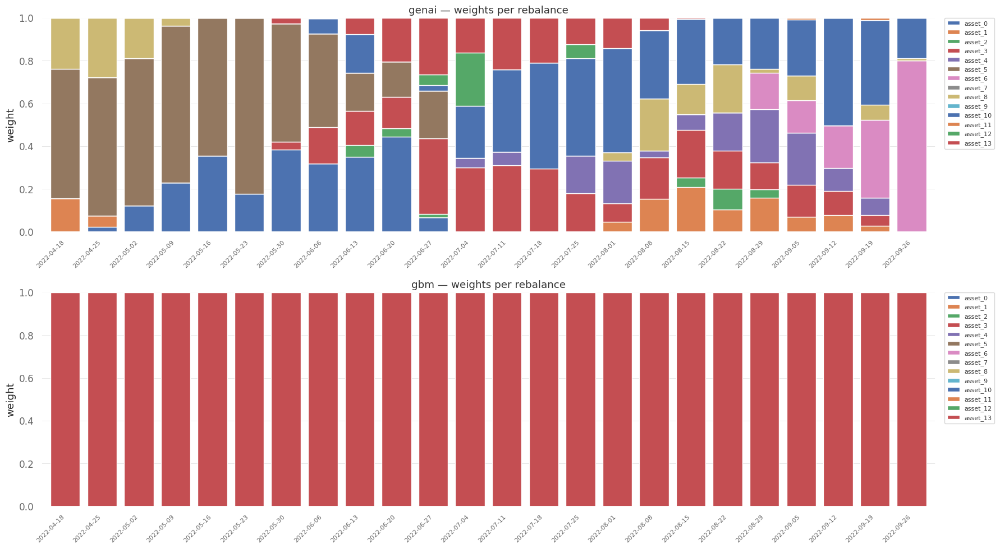

2026-03-23 03:11:53,239 - entities.portfolio - INFO - Strategy: genai vs Benchmark: gbm
2026-03-23 03:11:54,343 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,349 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,388 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,389 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,438 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,439 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,440 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,485 - matplotlib.font_manager - WARNING - findfont: Font family 'Arial' not found.
2026-03-23 03:11:54,539 - matplotlib.font_manager - WARNING - findfont: Font family 'Ari

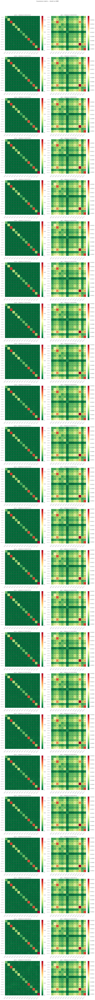

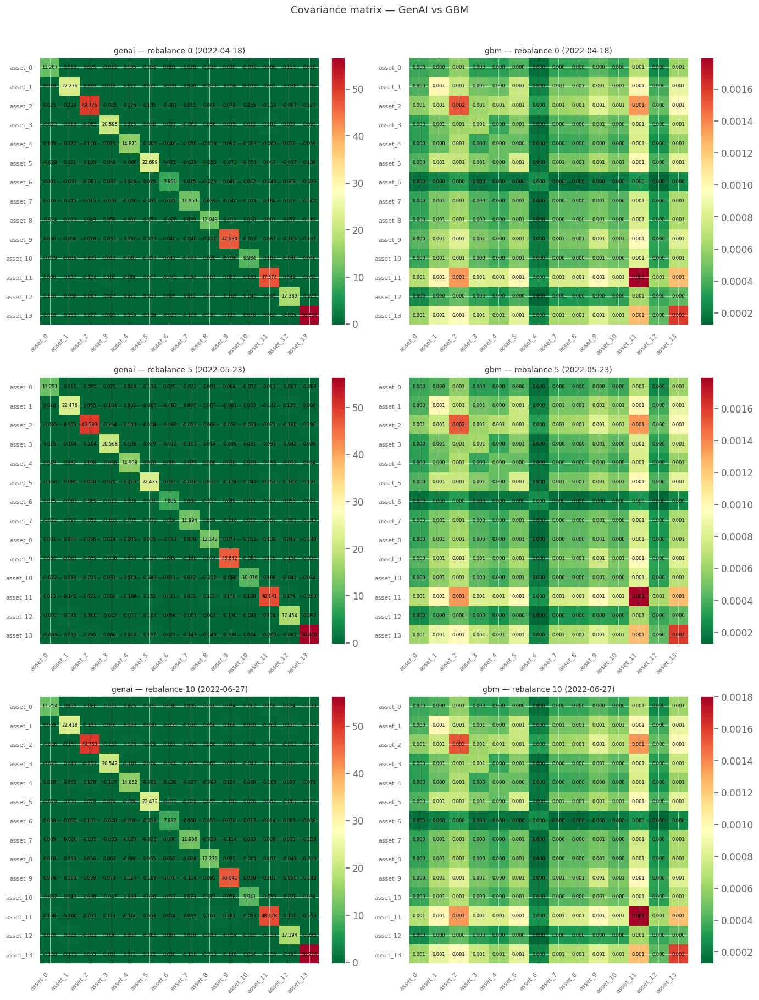

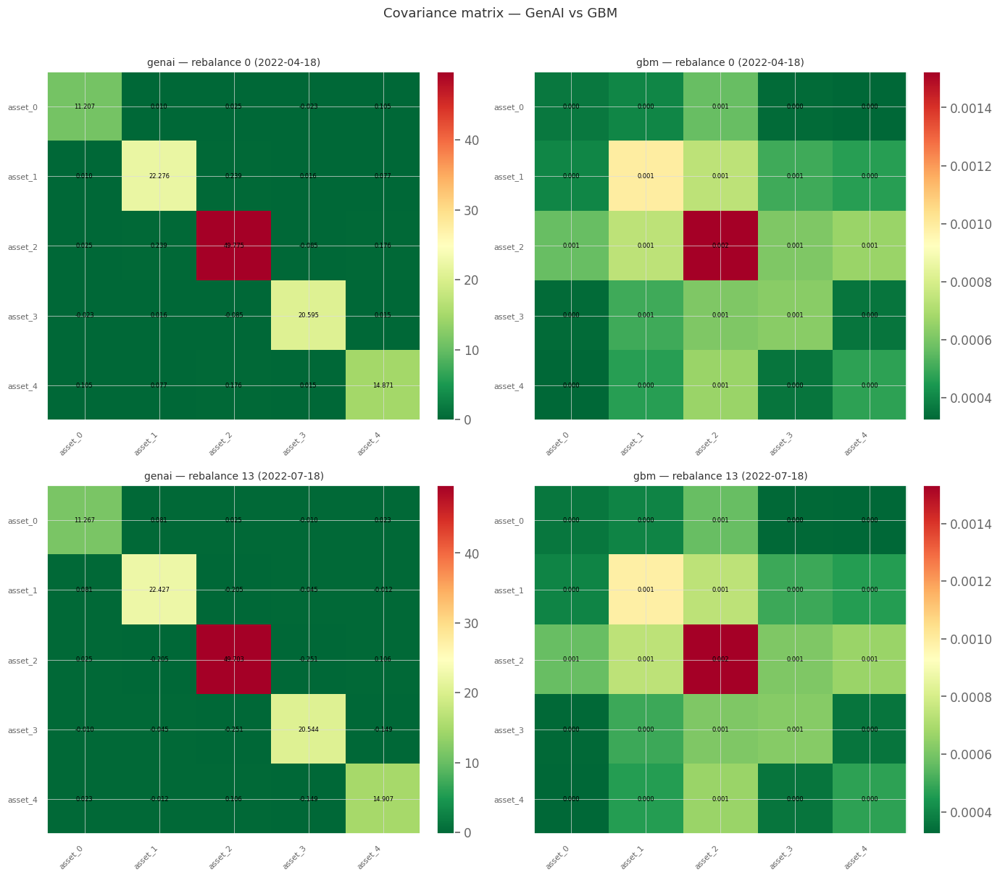

FigureWidget({
    'data': [{'legendgroup': '0',
              'line': {'color': '#1f77b4'},
              'name': 'Close',
              'showlegend': True,
              'type': 'scatter',
              'uid': '6ce19e65-641d-420c-a56b-f384275797d9',
              'x': array(['2022-04-18T00:00:00.000000000', '2022-04-19T00:00:00.000000000',
                          '2022-04-20T00:00:00.000000000', '2022-04-21T00:00:00.000000000',
                          '2022-04-22T00:00:00.000000000', '2022-04-25T00:00:00.000000000',
                          '2022-04-26T00:00:00.000000000', '2022-04-27T00:00:00.000000000',
                          '2022-04-28T00:00:00.000000000', '2022-04-29T00:00:00.000000000',
                          '2022-05-02T00:00:00.000000000', '2022-05-03T00:00:00.000000000',
                          '2022-05-04T00:00:00.000000000', '2022-05-05T00:00:00.000000000',
                          '2022-05-06T00:00:00.000000000', '2022-05-09T00:00:00.000000000',
            

In [ ]:
portfolio = Portfolio(annual_risk_free_rate=annual_risk_free_rate)

portfolios = portfolio.experiment(
    gt_returns=gt_returns,                    # (steps_sim, A)
    strategies={
        "genai": mc_genai.detach().cpu().numpy() if isinstance(mc_genai, torch.Tensor) else mc_genai,                    # (N_PATHS, steps_sim, A)
        "gbm":   mc_gbm.detach().cpu().numpy()   if isinstance(mc_gbm,   torch.Tensor) else mc_gbm,                      # (N_PATHS, steps_sim, A)
    },
    benchmark_strategy="gbm",
    rebalance_freq=train_config.rebalance_frequency,
    optimize_window=train_config.optimize_window,
    start_date=dates[0].date(),
    end_date=dates[-1].date(),
    transaction_cost=train_config.transaction_cost_rate,
    init_cash=1.0,
    is_log_return=True,
    method="Per-Path",
    output_dir=str(em.dirs["eval"]),
    output_suffix=f"_sample{sample_idx}",
)

portfolios["genai"].plot()
portfolios["gbm"].plot()

In [ ]:
print("=== scale check ===")
print(f"gt_returns      mean={gt_returns.mean():.6f}  std={gt_returns.std():.6f}")
print(f"mc_gbm          mean={mc_gbm.mean():.6f}  std={mc_gbm.std():.6f}")
print(f"mc_genai scaled mean={mc_genai_scaled.mean():.6f}  std={mc_genai_scaled.std():.6f}")
print(f"mc_genai        mean={mc_genai.mean():.6f}  std={mc_genai.std():.6f}")

=== scale check ===
gt_returns      mean=-0.002106  std=0.029904
mc_gbm          mean=-0.002224  std=0.028016
mc_genai scaled mean=-0.374048  std=221.568222
mc_genai        mean=-0.007984  std=5.015891


In [ ]:
import vectorbt as vbt

print(vbt.Portfolio)

<class 'vectorbt.portfolio.base.Portfolio'>


In [ ]:
print([m for m in dir(vbt.Portfolio) if m.startswith("plot")])


['plot', 'plot_asset_flow', 'plot_asset_value', 'plot_assets', 'plot_cash', 'plot_cash_flow', 'plot_cum_returns', 'plot_drawdowns', 'plot_gross_exposure', 'plot_net_exposure', 'plot_orders', 'plot_position_pnl', 'plot_positions', 'plot_trade_pnl', 'plot_trades', 'plot_underwater', 'plot_value', 'plots', 'plots_defaults']
